In [7]:
from bornagain import deg, nm, R3
import os
from matplotlib import pyplot as plt
from bornagain import ba_plot as bp
import bornagain as ba
import numpy as np
import time
from importlib import reload
import GISAXS_V6_ROI as g2

In [8]:
#For Feb Data
realDat_axes_Feb = [-3.1895200744655168, 3.1895200744655168, -3.1895200744655163, 3.189520074465517]

In [9]:
directory1 = r'C:\Users\Pedro\OneDrive - McMaster University\PhD - School\Research\Characterization\Beamtime 2024 Data\GiSAXS\High concentration solutions\35_2000RPM_40mgPml_polymer'
filename1 = '35_2000RPM_40mgPml_polymer_0.15.S372.N041.7292215.720981.35717_814.tif'
realData_npArray = g2.real_data(filename1, directory1)
realData_npArray = g2.center_img(realData_npArray)

In [4]:
def normalize_by_first_peak(
    x,
    y,
    x_min=0.14,
    x_max=0.16,
):
    """
    Normalize y by the height of the *first* peak whose x-coordinate lies
    within [x_min, x_max].

    Parameters
    ----------
    x, y : array-like
        1-D coordinate and signal arrays of equal length.
    x_min, x_max : float
        Inclusive x-range in which to look for the peak.  Defaults to
        0.14 ≤ x ≤ 0.16.

    Returns
    -------
    x_out, y_norm : ndarray, ndarray
        (Possibly sorted) x array and y divided by the chosen peak height.

    Raises
    ------
    ValueError
        If the range contains no points or the peak height is zero.
    """
    x = np.asarray(x)
    y = np.asarray(y)

    # sort by x if necessary
    if np.any(np.diff(x) < 0):
        order = np.argsort(x)
        x, y = x[order], y[order]

    # indices inside the specified window
    in_window = np.where((x >= x_min) & (x <= x_max))[0]
    if in_window.size == 0:
        raise ValueError(f"No data points with {x_min} ≤ x ≤ {x_max}")

    # iterate over window indices to find first local maximum
    peak_idx = None
    for i in in_window:
        # avoid edges where i==0 or i==len(y)-1
        if 0 < i < len(y) - 1 and y[i - 1] < y[i] >= y[i + 1]:
            peak_idx = i
            break

    # fallback: pick highest point in the window
    if peak_idx is None:
        peak_idx = in_window[np.nanargmax(y[in_window])]

    peak_height = y[peak_idx]
    if peak_height == 0:
        raise ValueError("Peak height is zero; cannot normalize.")

    return x, y / peak_height

In [5]:
# Roman numerals for subplot titles
ROMAN_NUMERALS = ["I", "II", "III", "IV", "V"]

def plot_qy_linecut(ax, qy, simulation_data, experimental_data, axes_sim, axes_exp, labels, linecut_index):
    ax.set_title(f'Linecut {ROMAN_NUMERALS[linecut_index]}')

    horizontal_slice_1 = qy + 0.05
    horizontal_slice_2 = qy - 0.05

    if simulation_data is not None:
        x, y = g2.integrate_plt_slices(
            start=horizontal_slice_2,
            stop=horizontal_slice_1,
            data=simulation_data,
            axLim=axes_sim,
            labelname="Simulation",
            num=10,
            horiz_slice=True
        )
        ax.plot(x, y, label=labels[0])

    if experimental_data is not None:
        x, y = g2.integrate_plt_slices(
            start=horizontal_slice_2,
            stop=horizontal_slice_1,
            data=experimental_data,
            axLim=axes_exp,
            labelname="Experiment",
            num=10,
            horiz_slice=True
        )
        ax.plot(x, y, label=labels[1])

    ax.set_ylabel("Intensity")
    ax.set_xlabel(r'$Q_{y} \;(1/{\rm nm})$')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_ylim(bottom=10)
    ax.legend()

def plot_qz_linecut(ax, qz, simulation_data, experimental_data, axes_sim, axes_exp, labels, linecut_index):
    ax.set_title(f'Linecut {ROMAN_NUMERALS[linecut_index]}')

    vertical_slice_1 = qz + 0.05
    vertical_slice_2 = qz - 0.05

    x_data_all, y_data_all = [], []

    if simulation_data is not None:
        x, y = g2.integrate_plt_slices(
            start=vertical_slice_2,
            stop=vertical_slice_1,
            data=simulation_data,
            axLim=axes_sim,
            labelname="Simulation",
            num=10,
            vert_slice=True
        )
        ax.plot(x, y, label=labels[0])
        x_data_all.extend(x)
        y_data_all.extend(y)

    if experimental_data is not None:
        x, y = g2.integrate_plt_slices(
            start=vertical_slice_2,
            stop=vertical_slice_1,
            data=experimental_data,
            axLim=axes_exp,
            labelname="Experiment",
            num=10,
            vert_slice=True
        )
        ax.plot(x, y, label=labels[1])
        x_data_all.extend(x)
        y_data_all.extend(y)

    ax.set_ylabel("Intensity")
    ax.set_xlabel(r'$Q_{z} \;(1/{\rm nm})$')
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_ylim(bottom=10)
    if x_data_all:
        ax.set_xlim(min(x_data_all), max(x_data_all))
    if y_data_all:
        ax.set_ylim(min(y_data_all), max(y_data_all) * 1.1)
    ax.legend()

def linecutsItoV(
    simulation_data=None,
    experimental_data=None,
    L1_qz=None, L2_qy=None, L3_qz=None, L4_qy=None, L5_qz=None,
    axes_exp =None,
    labels=("Simulation", "Experiment"),
    title=""
):
    if simulation_data is None and experimental_data is None:
        print("No data provided.")
        return

    # Define active linecuts
    linecuts = [
        ("qy", L1_qz),
        ("qz", L2_qy),
        ("qy", L3_qz),
        ("qz", L4_qy),
        ("qy", L5_qz)
    ]
    active_linecuts = [(kind, val) for kind, val in linecuts if val is not None]
    n = len(active_linecuts)

    if n == 0:
        print("No linecuts defined.")
        return

    axes_sim = g2.get_axes_limits(result, ba.Coords_QSPACE) if simulation_data is not None else None

    fig, axs = plt.subplots(1, n, figsize=(5 * n, 5))
    if n == 1:
        axs = [axs]

    for i, (ax, (kind, val)) in enumerate(zip(axs, active_linecuts)):
        if kind == "qy":
            plot_qy_linecut(ax, val, simulation_data, experimental_data, axes_sim, axes_exp, labels, i)
        elif kind == "qz":
            plot_qz_linecut(ax, val, simulation_data, experimental_data, axes_sim, axes_exp, labels, i)

    fig.suptitle("Simulation: " + title, fontsize=16)
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()


In [6]:
def plot2D(
    realData=None,
    simulationData=None,
    realDat_axes=None,
    graphed_axes=[-1, 1, 0, 2],
    L1_qz=None, L2_qy=None, L3_qz=None, L4_qy=None, L5_qz=None,
    title="",
    zlim=[22, 5e5]
):
    if simulationData is None and realData is None:
        print("No data provided.")
        return

    datasets = []
    axes_list = []

    if simulationData is not None:
        datasets.append(("Simulation", simulationData))
        axes_list.append(g2.get_axes_limits(result, ba.Coords_QSPACE))
        graphed_axes = g2.get_axes_limits(result, ba.Coords_QSPACE)
    if realData is not None:
        datasets.append(("Experiment", realData))
        axes_list.append(realDat_axes)

    n = len(datasets)
    plt.figure(figsize=(7.5 * n, 6))

    # Linecut definitions with labels
    vert_lines = [(L2_qy, 'II'), (L4_qy, 'IV')]
    horiz_lines = [(L1_qz, 'I'), (L3_qz, 'III'), (L5_qz, 'V')]

    for i, ((label, data), axes) in enumerate(zip(datasets, axes_list)):
        plt.subplot(1, n, i + 1)

        im = bp.plot_array(
            data,
            axes_limits=axes,
            intensity_min=zlim[0],
            intensity_max=zlim[1],
            xlabel=r'$Q_{y} \;(1/{\rm nm})$',
            ylabel=r'$Q_{z} \;(1/{\rm nm})$',
            zlabel=None,
            with_cb=True,
            cmap='gist_ncar'
        )
        ax = im.axes
        ax.set_title(label if label == "Experiment" else f"{label}: {title}", fontsize=14)

        ax.set_xlim(graphed_axes[0], graphed_axes[1])
        ax.set_ylim(graphed_axes[2], graphed_axes[3])
        ax.xaxis.label.set_fontsize(14)
        ax.yaxis.label.set_fontsize(14)

        # Draw vertical (qy) linecuts
        for qy, roman in vert_lines:
            if qy is not None:
                ax.axvline(x=qy, color='red', linewidth=1)
                ax.text(qy, graphed_axes[2], f'{roman}', color='red',
                        fontsize=12, ha='center', va='bottom', rotation=90)

        # Draw horizontal (qz) linecuts
        for qz, roman in horiz_lines:
            if qz is not None:
                ax.axhline(y=qz + 0.005, color='blue', linewidth=1)
                ax.axhline(y=qz - 0.005, color='red', linewidth=1)
                ax.text(graphed_axes[0], qz, f'{roman}', color='black',
                        fontsize=12, ha='left', va='center')

    plt.tight_layout()
    plt.show()


In [240]:
directory1 = r'C:\Users\Pedro\Data Transfer\Sample_35_3secIntegration'
filename1 = 'N0.tif'
realData_npArray_0p1deg = g2.real_data(filename1, directory1)
realData_npArray_0p1deg = g2.center_img(realData_npArray_0p1deg)

In [20]:
directory1 = r'C:\Users\Pedro\Data Transfer'
filename1 = '4_40mgPml_4824_27_2000RPM_0.15_6s.tif'
realData_npArray = g2.real_data(filename1, directory1)
realData_npArray = g2.center_img(realData_npArray)

In [21]:
region = [150, 155, 250, 212]
simulation_2D = g2.get_simulation_2D(sample_model=g2.get_sampleTest(), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
result = simulation_2D.simulate()
simul_dat = result.extracted_field()
test = simul_dat.npArray()

In [28]:
region = [150, 155, 212, 212]
simulation_2D = g2.get_simulation_2D(sample_model=g2.get_sampleTest(), detectorDistBeamtime= 'dec', angle = 0.15, beamIntensity = 8e12, ROI= region)
result = simulation_2D.simulate()
simul_dat = result.extracted_field()
test_small = simul_dat.npArray()

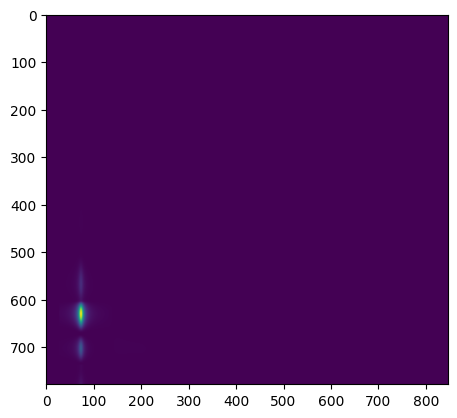

In [32]:
plt.imshow(test_small)

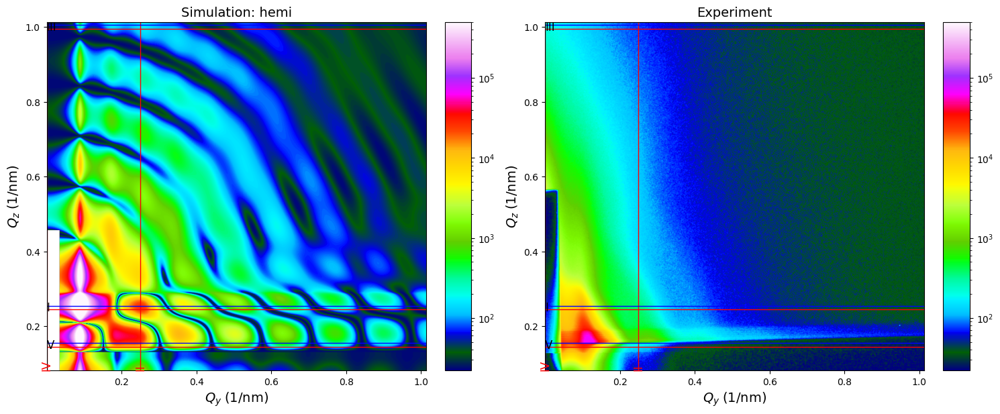

C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:83: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax.set_xlim(min(x_data_all), max(x_data_all))
C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:85: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(min(y_data_all), max(y_data_all) * 1.1)


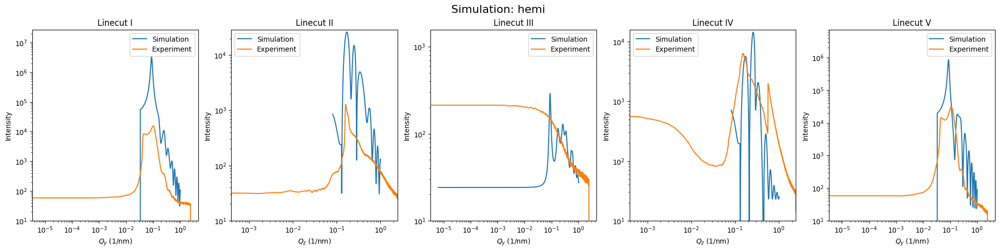

In [9]:
simData = test_small
linecuts=[
    0.25,
    0.25,
    1,
    0,
    0.15
]
plot2D(realData=realData_npArray, simulationData=simData, L1_qz=linecuts[0], L2_qy=linecuts[1], 
       L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')
linecutsItoV(simulation_data=simData, experimental_data=realData_npArray, L1_qz=linecuts[0], L2_qy=linecuts[1], 
       L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')

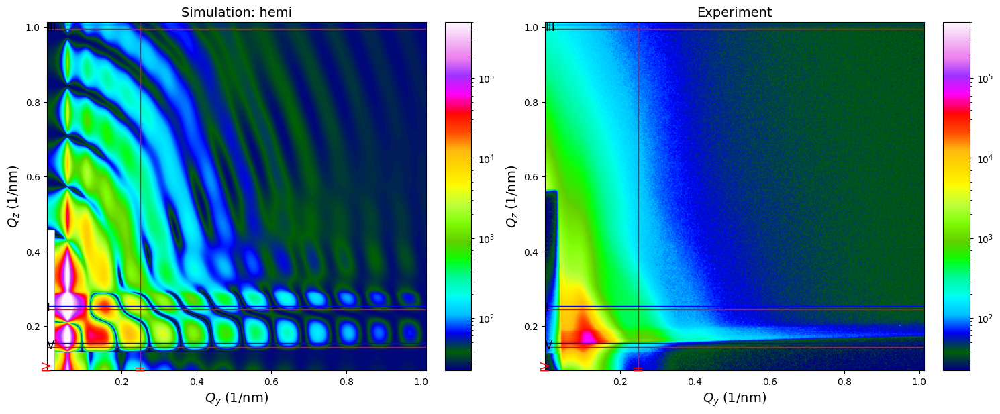

C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:83: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax.set_xlim(min(x_data_all), max(x_data_all))
C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:85: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(min(y_data_all), max(y_data_all) * 1.1)


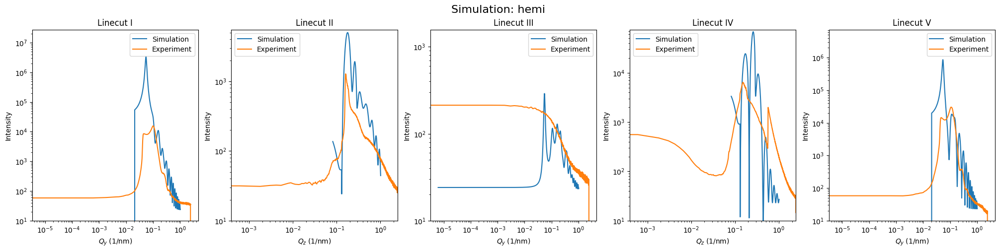

In [10]:
simData = test
linecuts=[
    0.25,
    0.25,
    1,
    0,
    0.15
]
plot2D(realData=realData_npArray, simulationData=simData, L1_qz=linecuts[0], L2_qy=linecuts[1], 
       L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')
linecutsItoV(simulation_data=simData, experimental_data=realData_npArray, L1_qz=linecuts[0], L2_qy=linecuts[1], 
       L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')

In [10]:
#!/usr/bin/env python3
"""
afm_sampling_tools.py
─────────────────────
BornAgain-independent utilities for AFM particle sampling:

I/O
  • load_lineprofiles(txt)  -> x_cols, y_cols (nm)
  • extract_hsub_and_dmin() -> hsub_nm, dmin_nm  (raw paired arrays)

2D Quantile Grid (correlation-preserving)
  • quantile_grid_edges(dmin, hsub, Qx, Qy) -> x_edges, y_edges
  • summarize_pairs_quantile_grid_with_edges(dmin, hsub, x_edges, y_edges, reducer)
       -> diam_rep, height_rep, weight_rep, labels
  • summarize_pairs_quantile_grid(dmin, hsub, Qx, Qy, reducer)
       -> diam_rep, height_rep, weight_rep
  • quantile_cell_counts(dmin, hsub, x_edges, y_edges) -> counts, weights_matrix

K-Medoids (PAM; deterministic)
  • kmedoids_pam(X, k, scale) -> medoid_indices, labels
  • summarize_pairs_kmedoids(dmin, hsub, K, scale)
       -> diam_rep, height_rep, weight_rep, labels

Visualization (matplotlib)
  • visualize_quantile_grid(dmin, hsub, x_edges?, y_edges?, Qx, Qy, reducer, ...)
  • visualize_kmedoids(dmin, hsub, diam_rep, height_rep, labels, weight_rep?, ...)
"""

from __future__ import annotations
from pathlib import Path
from typing import Tuple, Literal, Optional
import numpy as np
import pandas as pd

# ============================ I/O ============================

def load_lineprofiles(txt_path: str | Path) -> Tuple[np.ndarray, np.ndarray]:
    """
    Read whitespace-delimited file with interleaved x,y columns.
    Assumptions:
      - 2 header rows to skip
      - '-' as NA
      - x,y in meters; converts to nm
    Returns:
      x_cols, y_cols: arrays (N, K) with columns as profiles (nm)
    """
    df = (
        pd.read_csv(
            txt_path, delim_whitespace=True, skiprows=2, na_values="-", header=None
        ).dropna(axis=1, how="all")
    )
    if df.shape[1] % 2 != 0:
        raise ValueError(f"{txt_path}: uneven number of columns (expect x,y pairs).")
    x_cols = df.iloc[:, ::2].to_numpy(dtype=float) * 1e9  # m -> nm
    y_cols = df.iloc[:, 1::2].to_numpy(dtype=float) * 1e9
    return x_cols, y_cols

def extract_hsub_and_dmin(x_cols: np.ndarray, y_cols: np.ndarray, frac: float = 0.2
                          ) -> Tuple[np.ndarray, np.ndarray]:
    """
    For each profile (column) returns:
      hsub_nm: peak height above baseline, baseline = ½(min_L + min_R)
      dx20_nm: full width at `frac` (default 0.2) of hsub above the baseline
               i.e., distance between left/right x where y = baseline + frac*hsub

    Notes:
      - Uses first crossings moving outward from the peak on each side.
      - Linear interpolation is used between samples for sub-pixel accuracy.
      - If a crossing isn't found on either side, dx20 is NaN for that profile.
    """
    def _interp_cross(x, y, i, j, target):
        x1, x2 = float(x[i]), float(x[j])
        y1, y2 = float(y[i]), float(y[j])
        if y2 == y1:
            return (x1 + x2) * 0.5
        t = (target - y1) / (y2 - y1)
        t = np.clip(t, 0.0, 1.0)
        return x1 + t * (x2 - x1)

    hsub, dx20 = [], []
    for x, y in zip(x_cols.T, y_cols.T):
        m = np.isfinite(x) & np.isfinite(y)
        x, y = x[m], y[m]
        if y.size < 3:
            hsub.append(np.nan); dx20.append(np.nan); continue

        p = int(np.nanargmax(y))  # peak index

        # Baseline from minima to the left/right of the peak
        idxL_min = int(np.nanargmin(y[:p+1]))
        idxR_min = int(p + np.nanargmin(y[p:]))
        baseline = 0.5 * (float(y[idxL_min]) + float(y[idxR_min]))
        h = float(y[p]) - baseline
        hsub.append(h)

        if not np.isfinite(h) or h <= 0.0:
            dx20.append(np.nan); continue

        target = baseline + frac * h

        # Left crossing (scan outward from the peak)
        xL = np.nan
        for i in range(p-1, -1, -1):
            y_i, y_ip1 = y[i], y[i+1]
            if (y_i - target) == 0:
                xL = float(x[i]); break
            if (y_i - target) * (y_ip1 - target) < 0 or (y_ip1 - target) == 0:
                xL = _interp_cross(x, y, i, i+1, target)
                break

        # Right crossing
        xR = np.nan
        for i in range(p, len(y)-1):
            y_i, y_ip1 = y[i], y[i+1]
            if (y_i - target) == 0:
                xR = float(x[i]); break
            if (y_i - target) * (y_ip1 - target) < 0 or (y_ip1 - target) == 0:
                xR = _interp_cross(x, y, i, i+1, target)
                break

        dx20.append(abs(xR - xL) if np.isfinite(xL) and np.isfinite(xR) else np.nan)

    return np.asarray(hsub, float), np.asarray(dx20, float)


# ========================= 2D QUANTILE GRID =========================

def _safe_quantile_edges(v: np.ndarray, q: np.ndarray) -> np.ndarray:
    """
    Quantile edges with safeguards:
      - ensures strictly increasing edges by tiny jitter if needed
      - falls back to linspace if variance is ~0
    """
    v = np.asarray(v)
    if not np.isfinite(v).any():
        return np.array([0.0, 1.0])
    finite = v[np.isfinite(v)]
    if finite.size == 0:
        return np.array([0.0, 1.0])
    if np.nanstd(finite) == 0:
        return np.linspace(float(finite.min()), float(finite.max()) + 1e-9, len(q))
    edges = np.quantile(finite, q)
    for i in range(1, len(edges)):
        if edges[i] <= edges[i - 1]:
            edges[i] = edges[i - 1] + 1e-9
    return edges


def quantile_grid_edges(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    Qx: int = 6,
    Qy: int = 6,
) -> Tuple[np.ndarray, np.ndarray]:
    """Return quantile grid edges along diameter (x) and height (y)."""
    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    x = dmin_nm[m]; y = hsub_nm[m]
    Qx = max(1, int(Qx)); Qy = max(1, int(Qy))
    qx = np.linspace(0, 1, Qx + 1)
    qy = np.linspace(0, 1, Qy + 1)
    x_edges = _safe_quantile_edges(x, qx)
    y_edges = _safe_quantile_edges(y, qy)
    return x_edges, y_edges


def summarize_pairs_quantile_grid_with_edges(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    x_edges: np.ndarray,
    y_edges: np.ndarray,
    reducer: Literal["median", "mean"] = "median",
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Summarize using provided quantile edges (ensures viz & summary match).

    Returns:
      diam_rep   : (C,)  representative diameters (nm)
      height_rep : (C,)  representative heights (nm)
      weight_rep : (C,)  non-empty cell weights (sum=1)
      labels     : (N,)  linearized cell index per original sample (for viz)
    """
    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    x = dmin_nm[m]; y = hsub_nm[m]
    if x.size == 0:
        return np.array([]), np.array([]), np.array([]), np.array([])

    Qx = len(x_edges) - 1
    Qy = len(y_edges) - 1
    xi = np.clip(np.searchsorted(x_edges, x, side="right") - 1, 0, Qx - 1)
    yi = np.clip(np.searchsorted(y_edges, y, side="right") - 1, 0, Qy - 1)
    labels = yi + Qy * xi  # linear cell id per point

    diam_rep, height_rep, weight_rep = [], [], []
    N = x.size
    for i in range(Qx):
        for j in range(Qy):
            sel = (xi == i) & (yi == j)
            if not np.any(sel):
                continue
            if reducer == "median":
                d_rep = float(np.median(x[sel])); h_rep = float(np.median(y[sel]))
            else:
                d_rep = float(np.mean(x[sel]));   h_rep = float(np.mean(y[sel]))
            w = float(sel.sum()) / N
            diam_rep.append(d_rep); height_rep.append(h_rep); weight_rep.append(w)

    diam_rep   = np.asarray(diam_rep, dtype=float)
    height_rep = np.asarray(height_rep, dtype=float)
    weight_rep = np.asarray(weight_rep, dtype=float)

    # exact normalization
    s = weight_rep.sum()
    if s > 0:
        weight_rep /= s
        weight_rep[-1] += 1.0 - weight_rep.sum()

    return diam_rep, height_rep, weight_rep, labels


def summarize_pairs_quantile_grid(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    Qx: int = 6,
    Qy: int = 6,
    reducer: Literal["median", "mean"] = "median",
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Convenience wrapper that computes edges then summarizes.
    Returns:
      diam_rep, height_rep, weight_rep  (weights sum to 1)
    """
    xe, ye = quantile_grid_edges(dmin_nm, hsub_nm, Qx=Qx, Qy=Qy)
    diam_rep, height_rep, weight_rep, _ = summarize_pairs_quantile_grid_with_edges(
        dmin_nm, hsub_nm, xe, ye, reducer=reducer
    )
    return diam_rep, height_rep, weight_rep


def quantile_cell_counts(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    x_edges: np.ndarray,
    y_edges: np.ndarray,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Return (counts_matrix, weights_matrix) for the quantile grid.
    weights_matrix sums to 1 over all cells.
    """
    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    x, y = dmin_nm[m], hsub_nm[m]
    Qx = len(x_edges) - 1
    Qy = len(y_edges) - 1
    xi = np.clip(np.searchsorted(x_edges, x, side="right") - 1, 0, Qx - 1)
    yi = np.clip(np.searchsorted(y_edges, y, side="right") - 1, 0, Qy - 1)
    counts = np.zeros((Qx, Qy), dtype=int)
    for i, j in zip(xi, yi):
        counts[i, j] += 1
    weights = counts / counts.sum() if counts.sum() > 0 else counts.astype(float)
    return counts, weights

# ========================= K-MEDOIDS (PAM) =========================

def _zscore(X: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Z-score standardization with epsilon guard (deterministic)."""
    mu = np.mean(X, axis=0)
    sigma = np.std(X, axis=0, ddof=0)
    sigma = np.where(sigma == 0, 1.0, sigma)
    Z = (X - mu) / sigma
    return Z, mu, sigma

def _pairwise_euclidean(Z: np.ndarray) -> np.ndarray:
    """Dense pairwise Euclidean distance matrix (NxN)."""
    s = np.sum(Z**2, axis=1, keepdims=True)
    D2 = s + s.T - 2.0 * (Z @ Z.T)
    np.maximum(D2, 0.0, out=D2)
    return np.sqrt(D2, out=D2)

def _assign(D: np.ndarray, medoids: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Nearest and second-nearest medoid distances + labels."""
    M = D[:, medoids]
    order = np.argsort(M, axis=1)
    d1 = M[np.arange(M.shape[0]), order[:, 0]]
    d2 = M[np.arange(M.shape[0]), order[:, 1]] if M.shape[1] > 1 else np.full(M.shape[0], np.inf)
    labels = order[:, 0]
    return labels, d1, d2

def _pam_build(D: np.ndarray, k: int) -> np.ndarray:
    """BUILD phase: first medoid = min total distance; then greedy additions."""
    N = D.shape[0]
    total = np.sum(D, axis=1)
    medoids = [int(np.argmin(total))]
    d1 = D[:, medoids[0]].copy()
    while len(medoids) < k:
        best_gain = -np.inf; best_idx = None
        in_M = np.zeros(N, dtype=bool); in_M[medoids] = True
        for i in range(N):
            if in_M[i]:
                continue
            gain = np.sum(d1 - np.minimum(d1, D[:, i]))
            if gain > best_gain:
                best_gain = gain; best_idx = i
        medoids.append(int(best_idx))
        d1 = np.minimum(d1, D[:, best_idx])
    return np.asarray(medoids, dtype=int)

def _pam_swap(D: np.ndarray, medoids: np.ndarray, max_iter: int = 100) -> np.ndarray:
    """SWAP phase: try medoid/non-medoid swaps that reduce total cost."""
    N = D.shape[0]
    medoids = medoids.copy()
    in_M = np.zeros(N, dtype=bool); in_M[medoids] = True
    for _ in range(max_iter):
        labels, d1, d2 = _assign(D, medoids)
        current_cost = float(np.sum(d1))
        improved = False
        for mi, m in enumerate(medoids):
            for h in range(N):
                if in_M[h]:
                    continue
                Djh = D[:, h]
                use_d2 = (labels == mi)
                new_d = np.where(use_d2, np.minimum(d2, Djh), np.minimum(d1, Djh))
                new_cost = float(np.sum(new_d))
                if new_cost + 1e-12 < current_cost:
                    in_M[m] = False; in_M[h] = True
                    medoids[mi] = h
                    improved = True
                    break
            if improved:
                break
        if not improved:
            break
    return medoids

def kmedoids_pam(
    X: np.ndarray,
    k: int,
    scale: bool = True,
    max_iter: int = 100,
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Deterministic K-medoids (PAM).
    Returns:
      medoid_indices : (k,) indices into X of chosen medoids
      labels         : (N,) cluster label per point (0..k-1)
    """
    X = np.asarray(X, dtype=float)
    N = X.shape[0]
    k = max(1, min(int(k), N))
    Z = _zscore(X)[0] if scale else X.copy()
    D = _pairwise_euclidean(Z)
    medoids = _pam_build(D, k)
    medoids = _pam_swap(D, medoids, max_iter=max_iter)
    labels, _, _ = _assign(D, medoids)
    return medoids, labels

def summarize_pairs_kmedoids(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    K: int = 25,
    scale: bool = True,
) -> Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Reduce paired samples to K representative *observed* particles via K-medoids.
    Returns:
      diam_rep  : (K_actual,) nm  medoid diameters (from raw data)
      height_rep: (K_actual,) nm  medoid heights (from raw data)
      weight_rep: (K_actual,)     cluster weights (sum=1)
      labels    : (N_filtered,)    cluster label per original sample (for viz)
    """
    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    X = np.column_stack([dmin_nm[m], hsub_nm[m]])
    if len(X) == 0:
        return np.array([]), np.array([]), np.array([]), np.array([])
    medoid_idx, labels = kmedoids_pam(X, k=K, scale=scale)
    # representatives are real observed pairs
    diam_rep   = X[medoid_idx, 0]
    height_rep = X[medoid_idx, 1]
    # weights by occupancy
    uniq, counts = np.unique(labels, return_counts=True)
    weight_rep = counts.astype(float) / counts.sum()
    # exact normalization
    s = weight_rep.sum()
    if s > 0:
        weight_rep /= s
        weight_rep[-1] += 1.0 - weight_rep.sum()
    return diam_rep, height_rep, weight_rep, labels

# ========================= Visualization =========================

def visualize_quantile_grid(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    x_edges: Optional[np.ndarray] = None,
    y_edges: Optional[np.ndarray] = None,
    Qx: int = 6,
    Qy: int = 6,
    reducer: Literal["median", "mean"] = "median",
    figsize: Tuple[float, float] = (7.5, 6.0),
    scatter_alpha: float = 0.35,
    annotate_weights: bool = False,
    show: bool = True,
):
    """
    Plot raw points, overlay quantile grid, and draw representatives sized by weight.
    Returns: (fig, ax, (diam_rep, height_rep, weight_rep), (x_edges, y_edges))
    """
    import matplotlib.pyplot as plt

    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    x = dmin_nm[m]; y = hsub_nm[m]

    if x_edges is None or y_edges is None:
        x_edges, y_edges = quantile_grid_edges(x, y, Qx=Qx, Qy=Qy)

    # summarize using the same edges we visualize
    diam_rep, height_rep, weight_rep, _ = summarize_pairs_quantile_grid_with_edges(
        x, y, x_edges, y_edges, reducer=reducer
    )

    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(x, y, s=16, alpha=scatter_alpha, color="tab:gray", edgecolors="none", label="Raw data")

    for xv in x_edges[1:-1]:
        ax.axvline(xv, color="k", lw=0.8, alpha=0.25)
    for yv in y_edges[1:-1]:
        ax.axhline(yv, color="k", lw=0.8, alpha=0.25)

    if weight_rep.size:
        w = weight_rep / weight_rep.max()
        sizes = 600 * np.sqrt(w)
        ax.scatter(diam_rep, height_rep, s=sizes, color="tab:blue",
                   edgecolors="white", linewidths=0.9, label="Grid reps")
        if annotate_weights:
            for dx, hy, ww in zip(diam_rep, height_rep, weight_rep):
                ax.text(dx, hy, f"{100*ww:.1f}%", ha="center", va="bottom", fontsize=8)

    ax.set_xlabel("Δx between minima (nm)  [≈ diameter]")
    ax.set_ylabel("Background-subtracted height (nm)")
    ax.set_title(f"2D Quantile Grid (Qx={len(x_edges)-1}, Qy={len(y_edges)-1})")
    ax.grid(alpha=0.2); ax.legend(frameon=False, loc="best")
    fig.tight_layout()
    if show:
        plt.show()
    return fig, ax, (diam_rep, height_rep, weight_rep), (x_edges, y_edges)


def visualize_kmedoids(
    dmin_nm: np.ndarray,
    hsub_nm: np.ndarray,
    diam_rep: np.ndarray,
    height_rep: np.ndarray,
    labels: np.ndarray,
    weight_rep: Optional[np.ndarray] = None,
    figsize: Tuple[float, float] = (7.5, 6.0),
    annotate_weights: bool = True,
    show: bool = True,
):
    """
    Scatter raw points colored by cluster; overlay medoids (stars) sized by weight.
    Returns: (fig, ax)
    """
    import matplotlib.pyplot as plt

    m = np.isfinite(dmin_nm) & np.isfinite(hsub_nm)
    x = dmin_nm[m]; y = hsub_nm[m]
    if labels.shape[0] != x.shape[0]:
        raise ValueError("labels length must match number of finite raw pairs.")

    fig, ax = plt.subplots(figsize=figsize)
    sc = ax.scatter(x, y, c=labels, s=16, alpha=0.45, cmap="tab20", edgecolors="none", label="Raw data")

    if weight_rep is None or len(weight_rep) == 0:
        sizes = 300.0
    else:
        w = weight_rep / weight_rep.max()
        sizes = 800.0 * np.sqrt(w)

    ax.scatter(diam_rep, height_rep, marker="*", s=sizes, c="k",
               edgecolors="white", linewidths=0.9, label="Medoids")

    if annotate_weights and (weight_rep is not None) and len(weight_rep) == len(diam_rep):
        for dx, hy, ww in zip(diam_rep, height_rep, weight_rep):
            ax.text(dx, hy, f"{100*ww:.1f}%", ha="center", va="bottom", fontsize=8)

    ax.set_xlabel("Δx between minima (nm)  [≈ diameter]")
    ax.set_ylabel("Background-subtracted height (nm)")
    ax.set_title(f"K-medoids summary (K={len(diam_rep)})")
    ax.grid(alpha=0.25)
    fig.colorbar(sc, ax=ax, label="Cluster")
    ax.legend(frameon=False, loc="best")
    fig.tight_layout()
    if show:
        plt.show()
    return fig, ax



Start off by simulating just top surface at 0.1 deg and 0.15 deg to compare with different k samples

In [11]:
def get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling(P1, P2):
    material_PS = ba.RefractiveMaterial("PS", 2.50267703E-06, 2.46904652E-09)
    material_P2VP = ba.RefractiveMaterial("PS", 2.51436745E-06, 2.35391329E-09)
    material_Si_Sub = ba.RefractiveMaterial("Si Sub", 5.04383115E-06, 7.84182177E-08) #7.644e-06
    material_SiO2 = ba.RefractiveMaterial("SiO2", 4.74631315E-06, 4.16025294E-08)
    material_Vacuum = ba.RefractiveMaterial("Vacuum", 0.0, 0.0)

    omega_order = 6*nm
    spacing = 63*nm

    diam_K, height_K, weight_K, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=P1, scale=True)
    visualize_kmedoids(dmin_nm, hsub_nm, diam_K, height_K, labels, weight_rep=weight_K)
    
    #########################################----SURFACE PARTICLES----################################################
    surface_layout = ba.ParticleLayout()

    for i in range(P1):
        ff_PS = ba.HemiEllipsoid((diam_K[i]/2) * nm, (diam_K[i]/2) * nm, height_K[i] * nm)
        particle_PS= ba.Particle(material_PS, ff_PS)
        surface_layout.addParticle(particle_PS, weight_K[i])
    
    # Interference Functions
    iff = ba.InterferenceRadialParacrystal(spacing, 400*nm)
    iff_pdf = ba.Profile1DGauss(omega_order)
    iff.setProbabilityDistribution(iff_pdf)
    #iff.setKappa(P2) size-distribution model 

    #----------------Roughness---------------------------------------------
    #----------------PS----------------------------------------------------
    hurst = 0.49
    corr = 84*nm
    sig = 3.2*nm
    roughness_PS = ba.LayerRoughness(sig, hurst, corr)

    #----------------SiO2---------------------------------------------------
    hurst = 0.52
    corr = 10*nm
    sig = 0.2*nm
    roughness_SiO2 = ba.LayerRoughness(sig, hurst, corr)

    # Define layers
    layer_vac = ba.Layer(material_Vacuum)
    layer_PS_Top = ba.Layer(material_PS, 214.8*nm)
    layer_PS_Top.addLayout(surface_layout)
    layer_SiO2 = ba.Layer(material_SiO2, 2*nm)
    layer_Si = ba.Layer(material_Si_Sub)

     # Define sample 
    sample = ba.MultiLayer()
    sample.addLayer(layer_vac)
    sample.addLayerWithTopRoughness(layer_PS_Top, roughness_PS)
    sample.addLayerWithTopRoughness(layer_SiO2, roughness_SiO2)
    sample.addLayer(layer_Si)


    return sample

In [12]:
from time import perf_counter

C:\Users\Pedro\AppData\Local\Temp\ipykernel_28120\240485379.py:48: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  pd.read_csv(


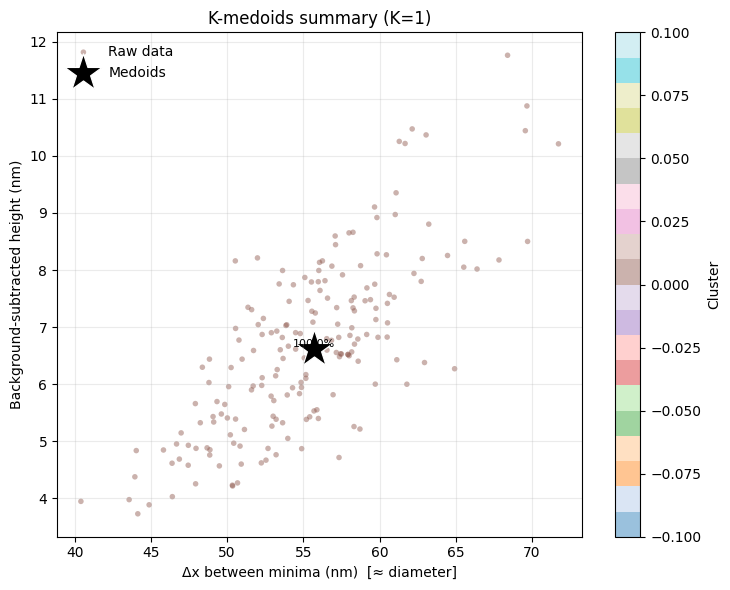

[6.617707]
[55.70521075]
K-medoids reps: 1  (weights sum to: 1.0 )


In [13]:

# Minimal test — adjust file path as needed
lineprofile_dir = r"C:\Users\Pedro\OneDrive - McMaster University\PhD - School\Research\Characterization\AFM\2024\4-29-2024\lineProfiles_35_Big_OnePerParticle.txt"
 
xc, yc = load_lineprofiles(lineprofile_dir)
hsub_nm, dmin_nm = extract_hsub_and_dmin(xc, yc)

# K-medoids demo
diamK, heightK, weightK, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=1, scale=True)
visualize_kmedoids(dmin_nm, hsub_nm, diamK, heightK, labels, weight_rep=weightK)

print(heightK)
print(diamK)

print("K-medoids reps:", len(diamK), " (weights sum to:", float(weightK.sum()), ")")

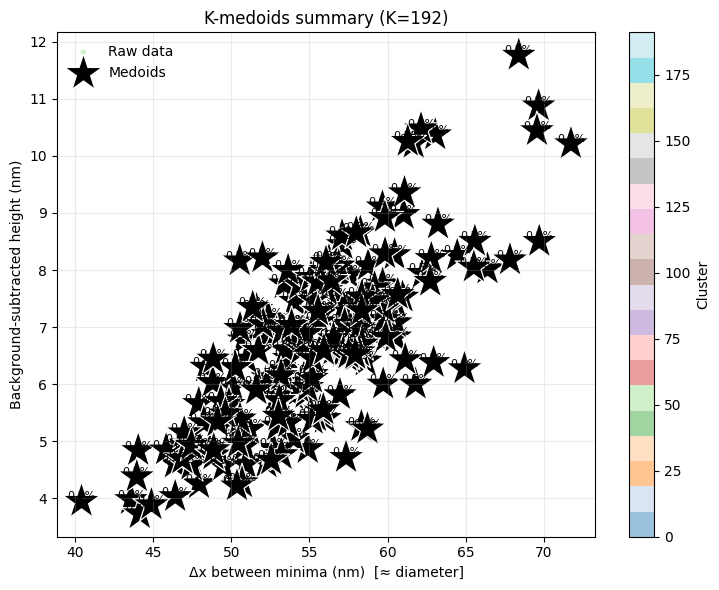

(<Figure size 750x600 with 2 Axes>,
 <Axes: title={'center': 'K-medoids summary (K=192)'}, xlabel='Δx between minima (nm)  [≈ diameter]', ylabel='Background-subtracted height (nm)'>)

In [14]:
hsub_nm, dmin_nm = extract_hsub_and_dmin(xc, yc)
# K-medoids demo
diamK, heightK, weightK, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=20000, scale=True)
visualize_kmedoids(dmin_nm, hsub_nm, diamK, heightK, labels, weight_rep=weightK)

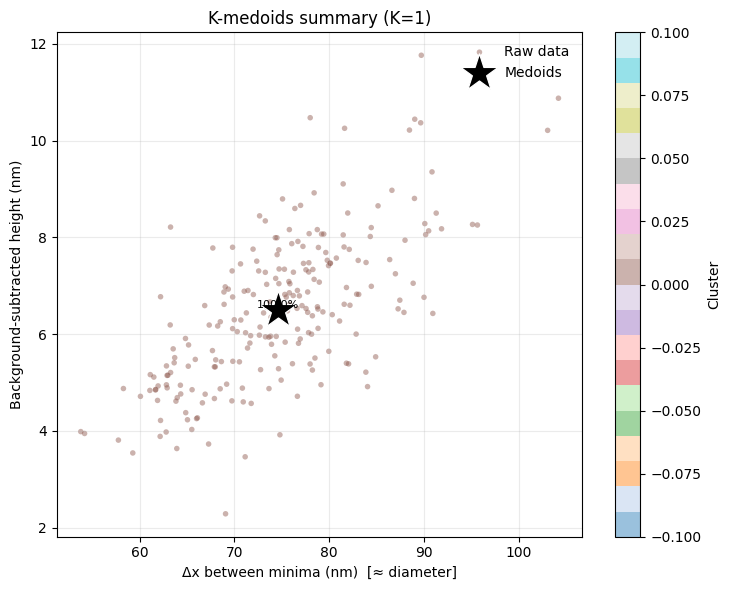

39.481327 s


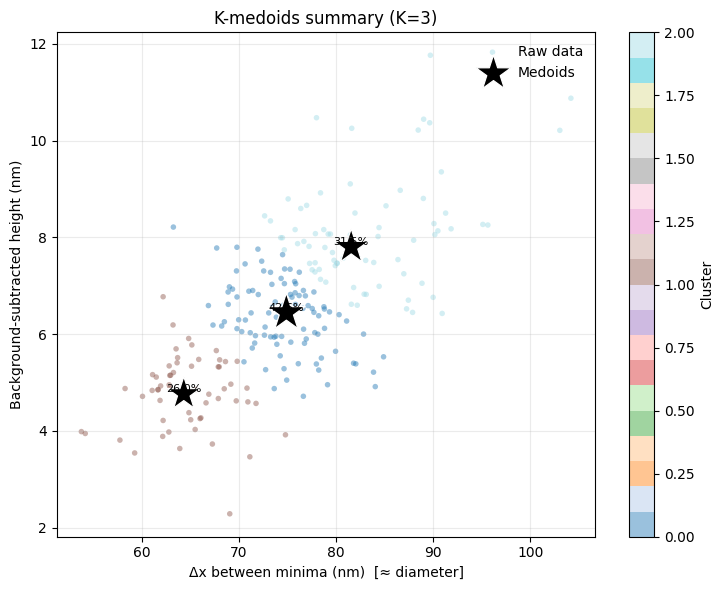

121.870002 s


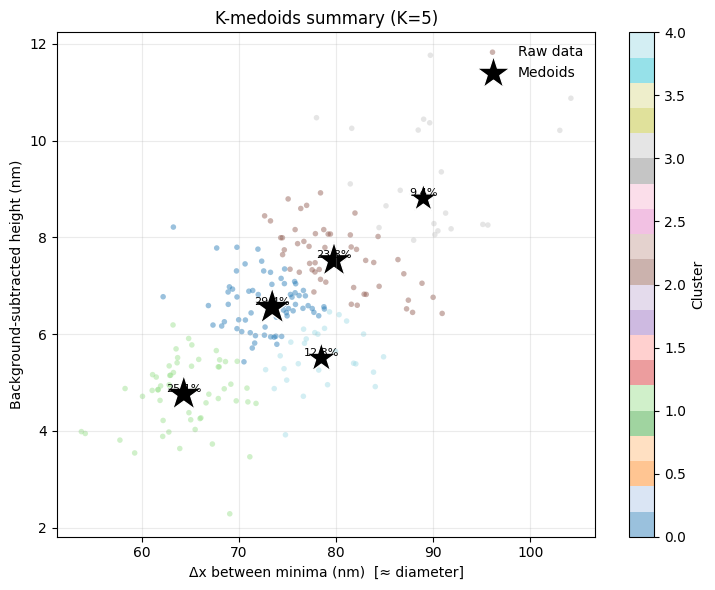

211.468848 s


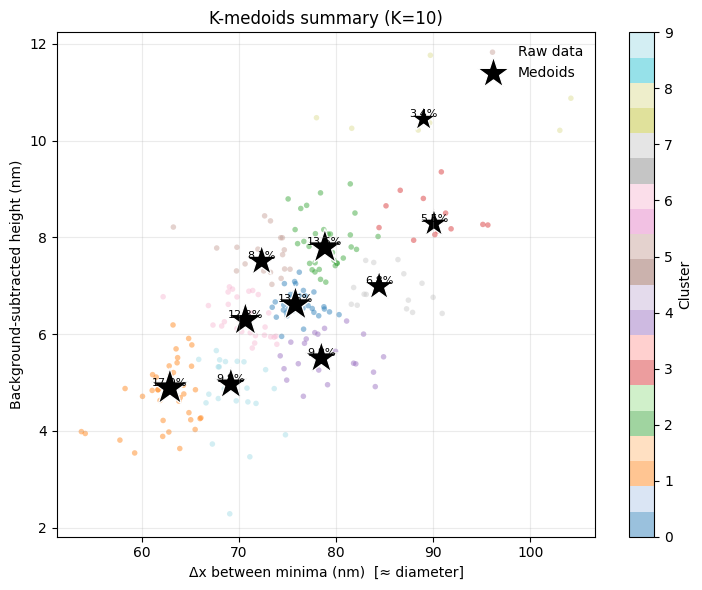

445.727478 s


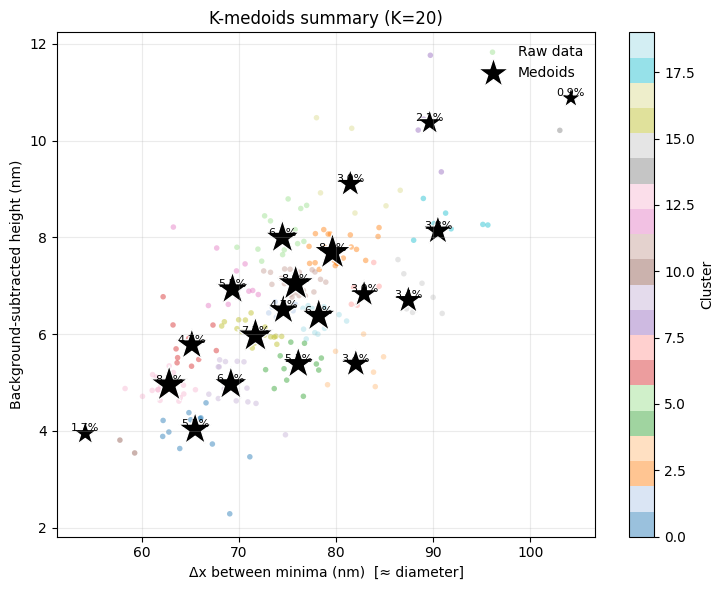

890.033846 s


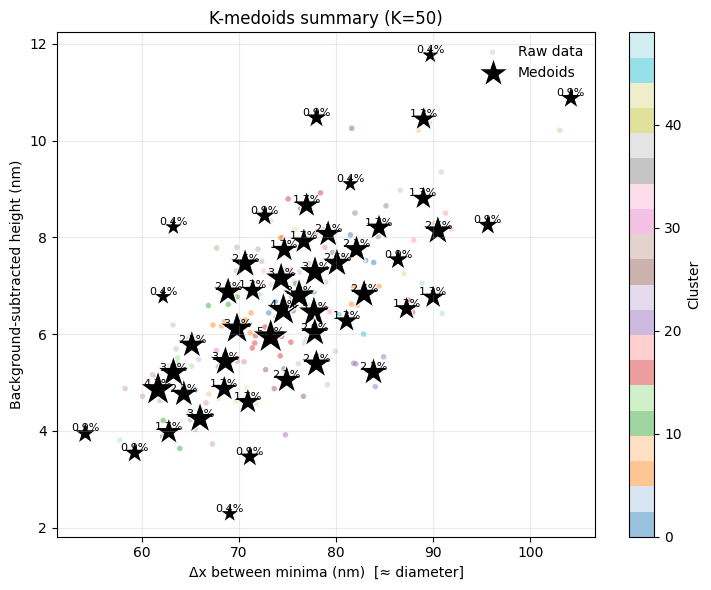

2200.616132 s


In [ ]:
region = [150, 155, 250, 250]
number_of_samples = [1,3,5,10,20,50]
simData_array = []
for num_Samp in number_of_samples:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling(num_Samp, 0), detectorDistBeamtime= 'feb', angle = 0.1, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_" + str(num_Samp) + '_0p1deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

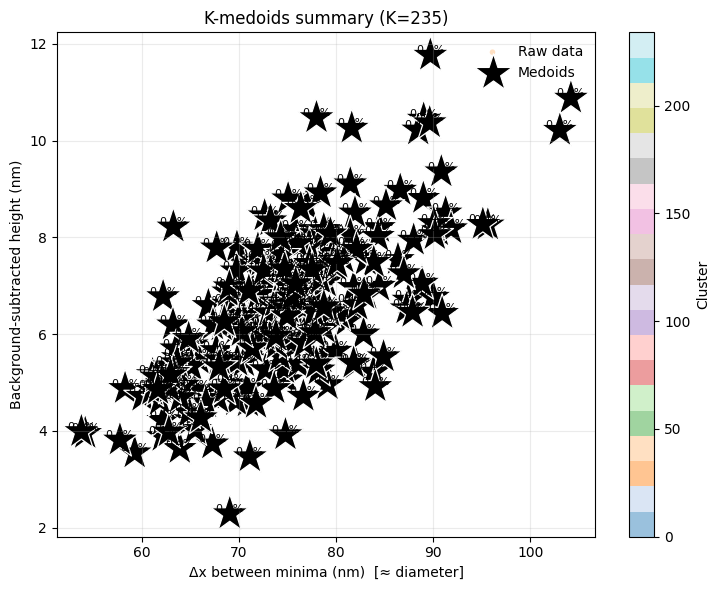

10269.905713 s


In [56]:
region = [150, 155, 250, 250]
number_of_samples = [235]
simData_array = []
for num_Samp in number_of_samples:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling(num_Samp, 0), detectorDistBeamtime= 'feb', angle = 0.10, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_" + str(num_Samp) + '_0p10deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

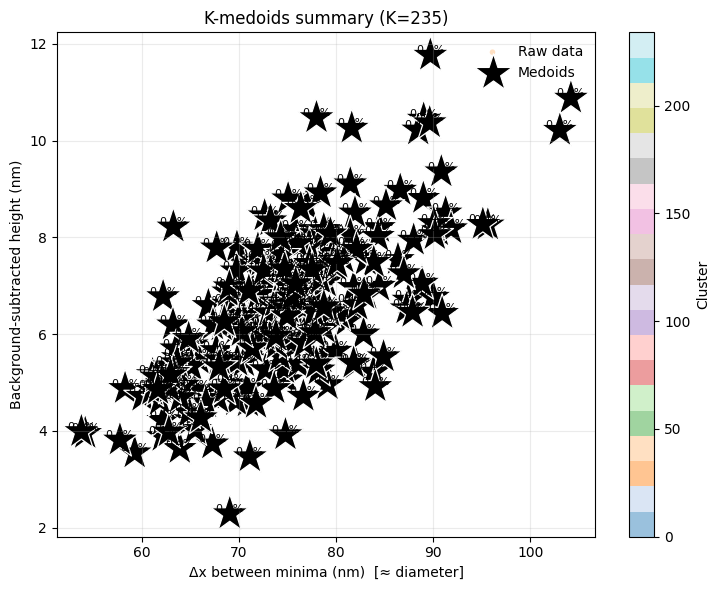

10219.839663 s


In [57]:
region = [150, 155, 250, 250]
number_of_samples = [235]
simData_array = []
for num_Samp in number_of_samples:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling(num_Samp, 0), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_" + str(num_Samp) + '_0p15deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

In [58]:
A=np.load("Sample35_JustSurface_AFM_k_235_0p15deg.txt.npy")

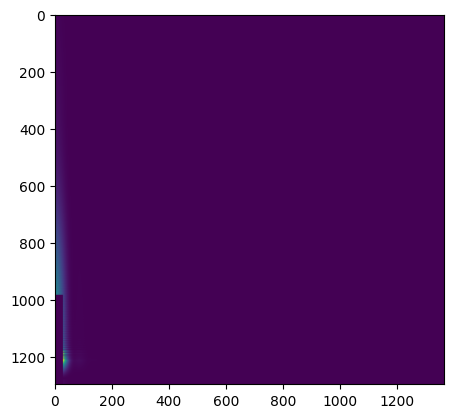

In [ ]:
plot2D(simulationData=A,)

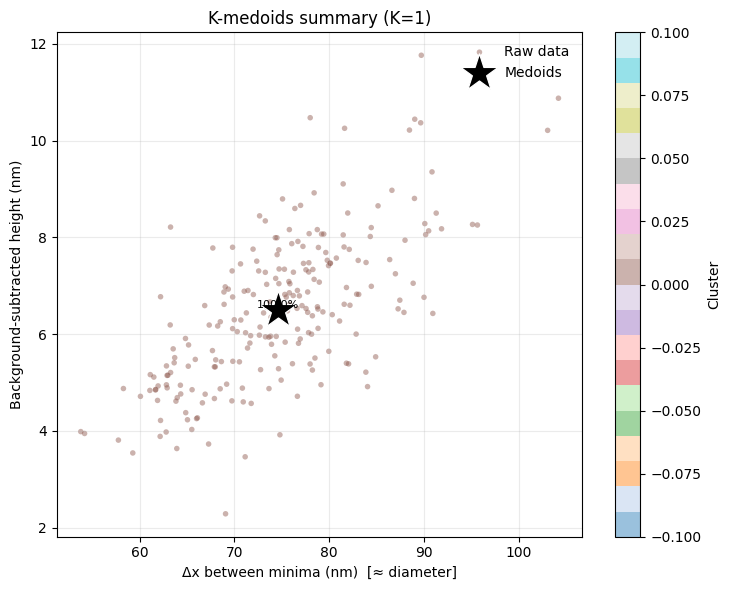

42.193335 s


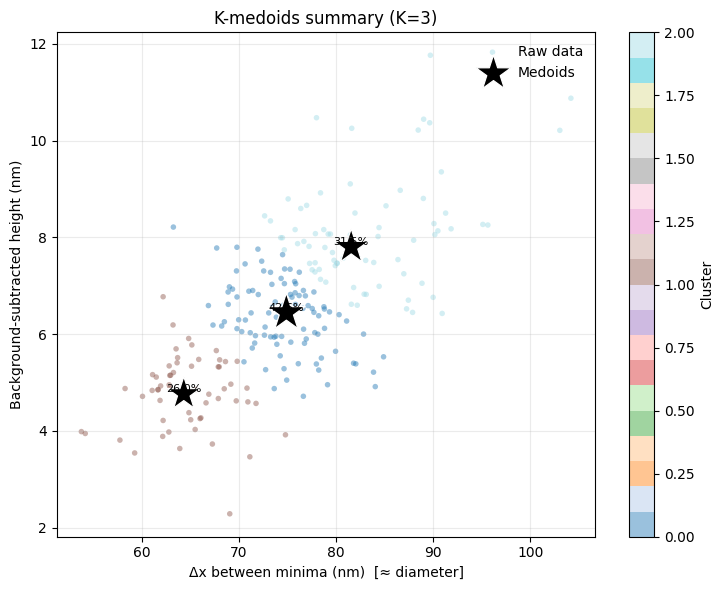

126.427093 s


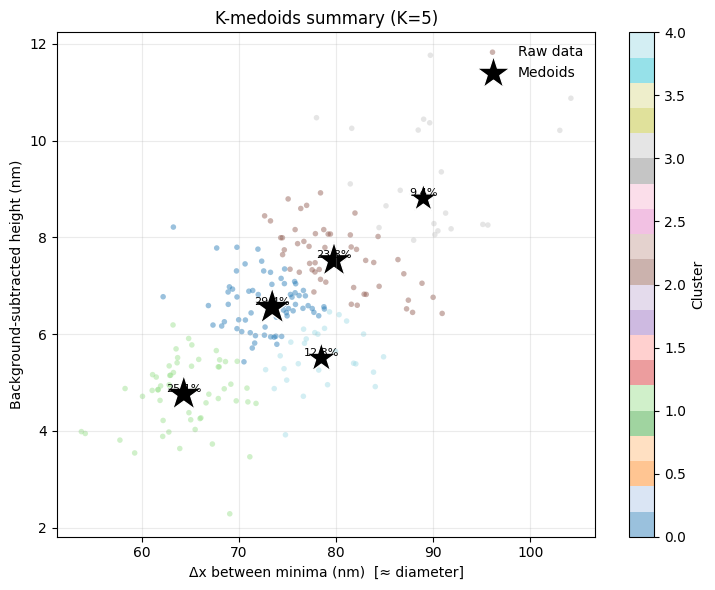

218.559187 s


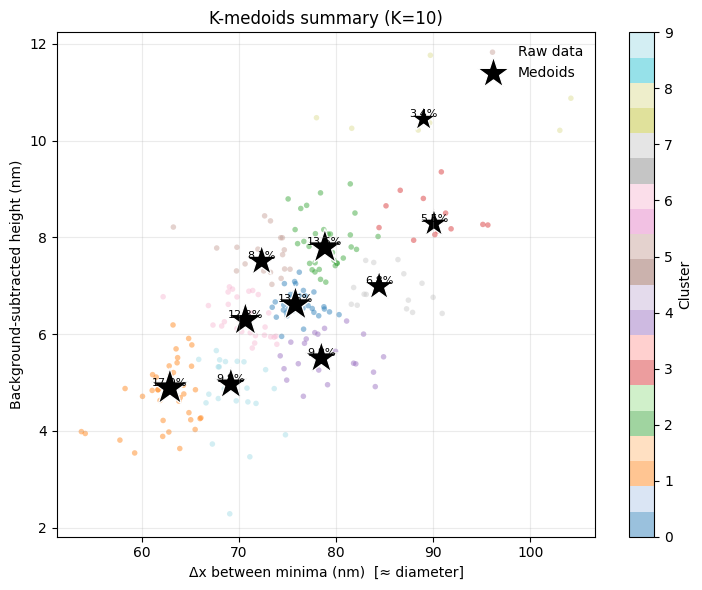

435.040092 s


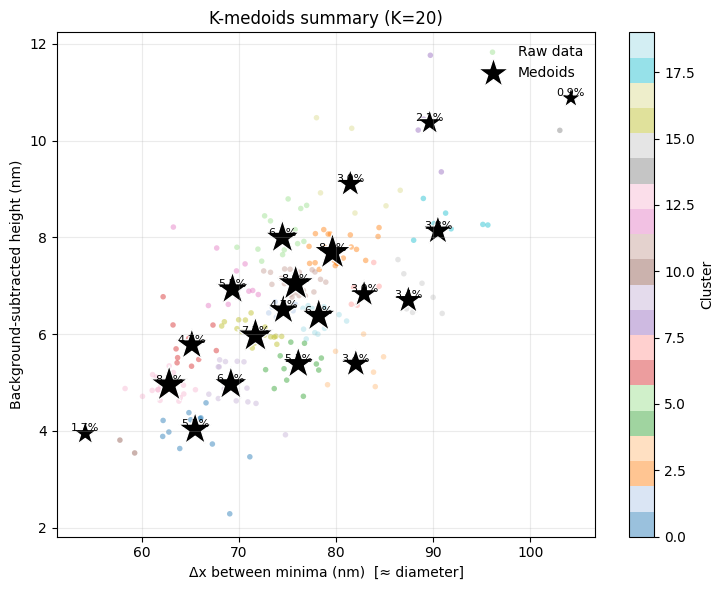

868.092468 s


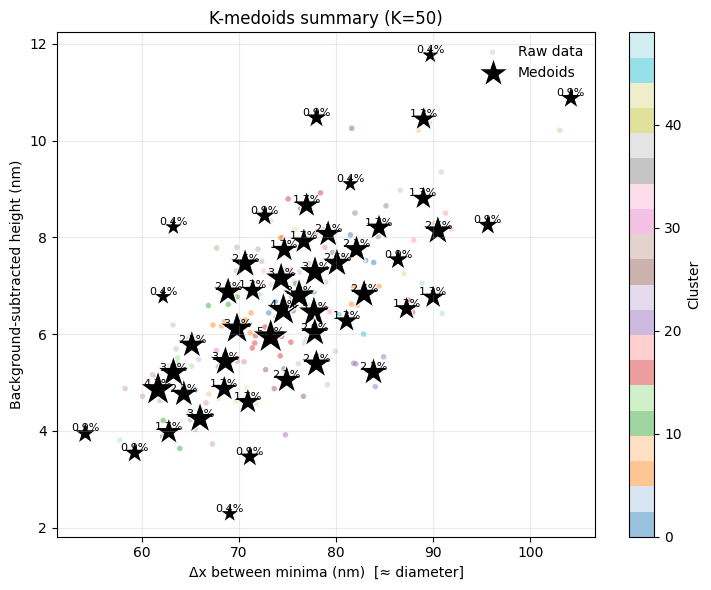

2132.796733 s


In [42]:
region = [150, 155, 250, 250]
number_of_samples = [1,3,5,10,20,50]
simData_array = []
for num_Samp in number_of_samples:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling(num_Samp, 0), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_" + str(num_Samp) + '_0p15deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

In [43]:
def get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_kappa(P1, P2):
    material_PS = ba.RefractiveMaterial("PS", 2.50267703E-06, 2.46904652E-09)
    material_P2VP = ba.RefractiveMaterial("PS", 2.51436745E-06, 2.35391329E-09)
    material_Si_Sub = ba.RefractiveMaterial("Si Sub", 5.04383115E-06, 7.84182177E-08) #7.644e-06
    material_SiO2 = ba.RefractiveMaterial("SiO2", 4.74631315E-06, 4.16025294E-08)
    material_Vacuum = ba.RefractiveMaterial("Vacuum", 0.0, 0.0)

    omega_order = 6*nm
    spacing = 63*nm

    diam_K, height_K, weight_K, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=P1, scale=True)
    visualize_kmedoids(dmin_nm, hsub_nm, diam_K, height_K, labels, weight_rep=weight_K)
    
    #########################################----SURFACE PARTICLES----################################################
    surface_layout = ba.ParticleLayout()

    for i in range(P1):
        ff_PS = ba.HemiEllipsoid((diam_K[i]/2) * nm, (diam_K[i]/2) * nm, height_K[i] * nm)
        particle_PS= ba.Particle(material_PS, ff_PS)
        surface_layout.addParticle(particle_PS, weight_K[i])
    
    # Interference Functions
    iff = ba.InterferenceRadialParacrystal(spacing, 400*nm)
    iff_pdf = ba.Profile1DGauss(omega_order)
    iff.setProbabilityDistribution(iff_pdf)
    iff.setKappa(P2) #size-distribution model 

    #----------------Roughness---------------------------------------------
    #----------------PS----------------------------------------------------
    hurst = 0.49
    corr = 84*nm
    sig = 3.2*nm
    roughness_PS = ba.LayerRoughness(sig, hurst, corr)

    #----------------SiO2---------------------------------------------------
    hurst = 0.52
    corr = 10*nm
    sig = 0.2*nm
    roughness_SiO2 = ba.LayerRoughness(sig, hurst, corr)

    # Define layers
    layer_vac = ba.Layer(material_Vacuum)
    layer_PS_Top = ba.Layer(material_PS, 214.8*nm)
    layer_PS_Top.addLayout(surface_layout)
    layer_SiO2 = ba.Layer(material_SiO2, 2*nm)
    layer_Si = ba.Layer(material_Si_Sub)

     # Define sample 
    sample = ba.MultiLayer()
    sample.addLayer(layer_vac)
    sample.addLayerWithTopRoughness(layer_PS_Top, roughness_PS)
    sample.addLayerWithTopRoughness(layer_SiO2, roughness_SiO2)
    sample.addLayer(layer_Si)


    return sample

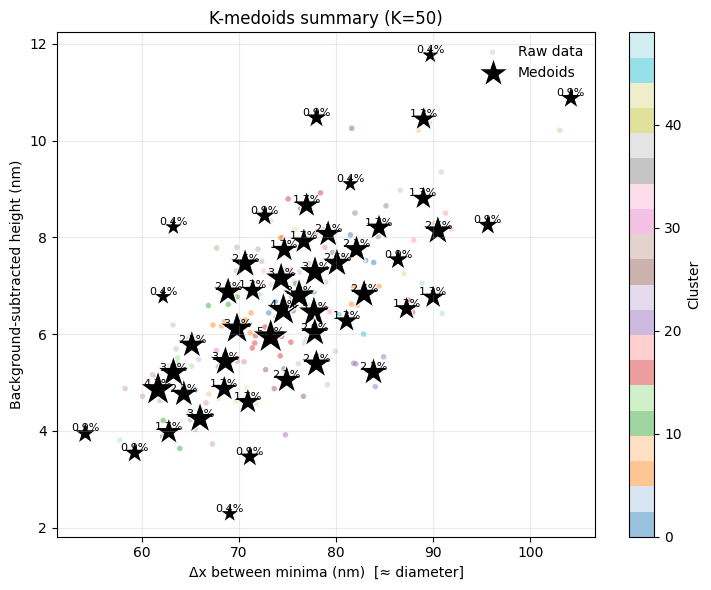

2264.966062 s


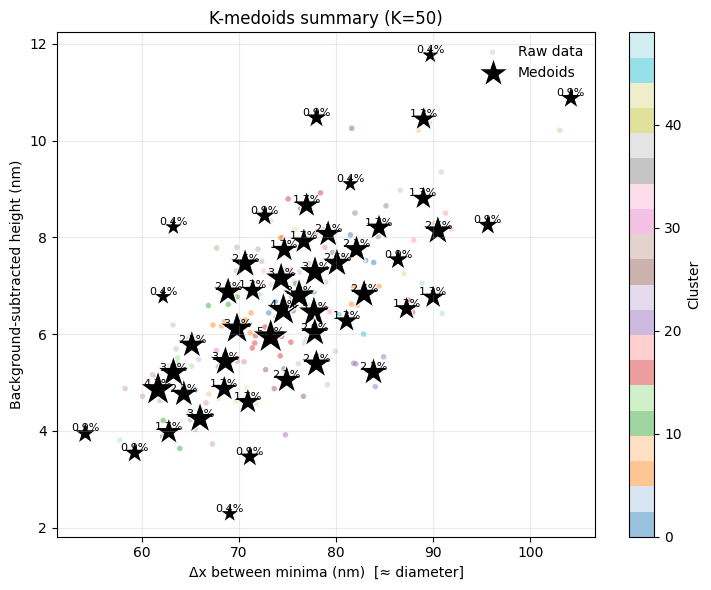

2271.402379 s


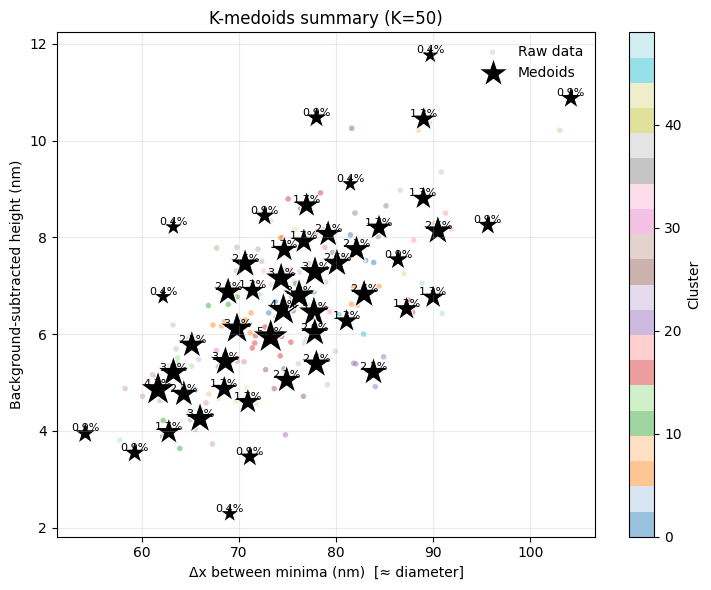

2260.222146 s


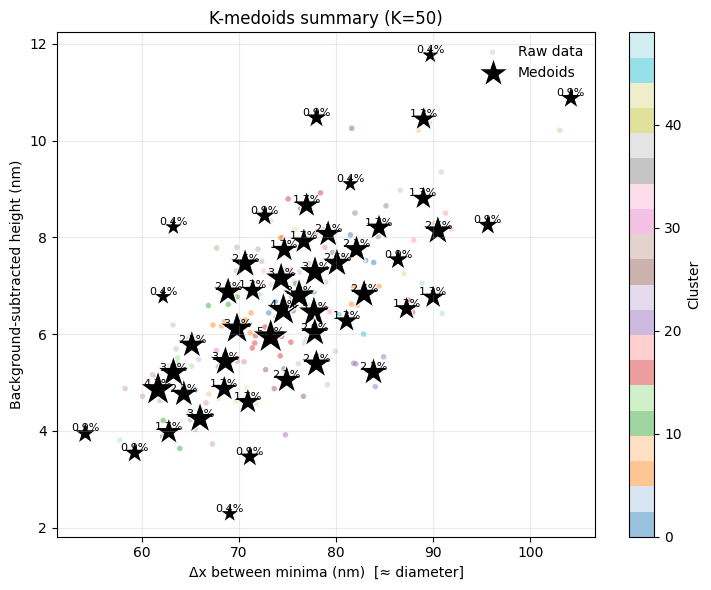

2267.033676 s


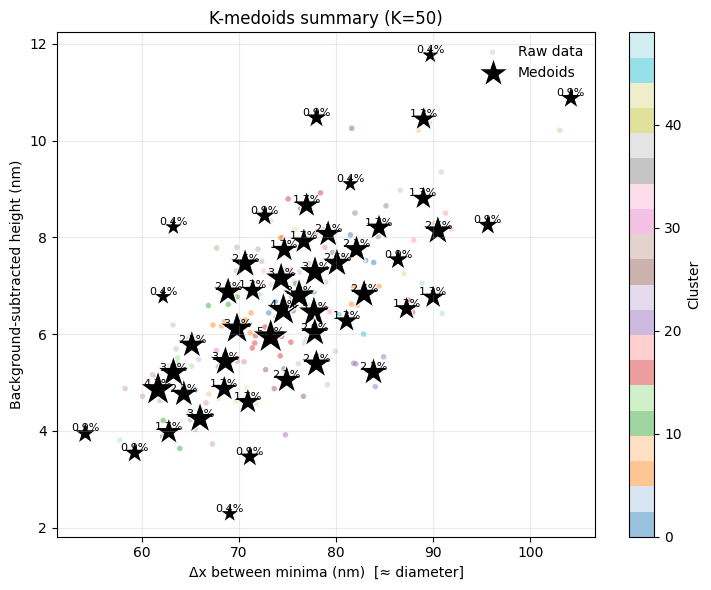

2273.624547 s


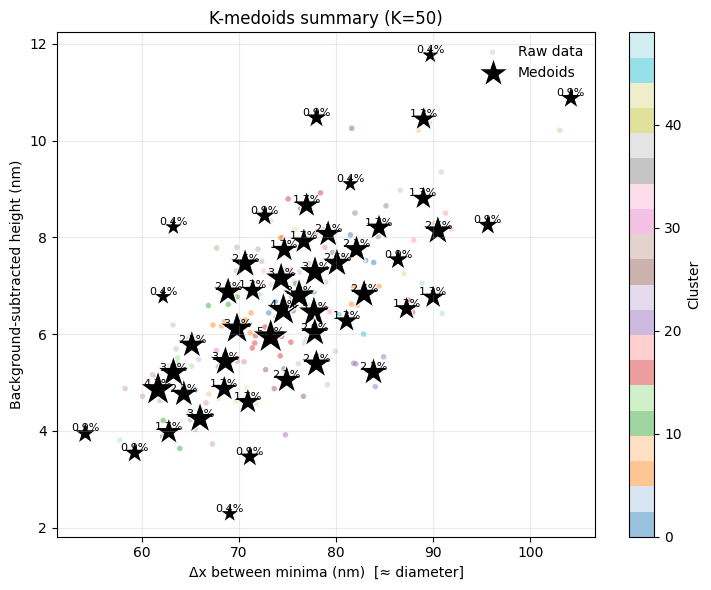

2249.124353 s


In [44]:
region = [150, 155, 250, 250]
number_of_samples = 50
kappa = [0, 1, 2, 3, 4, 10]
simData_array = []
for k in kappa:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_kappa(50, k), detectorDistBeamtime= 'feb', angle = 0.1, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_50_" + str(k) + '_kappa_0p1deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

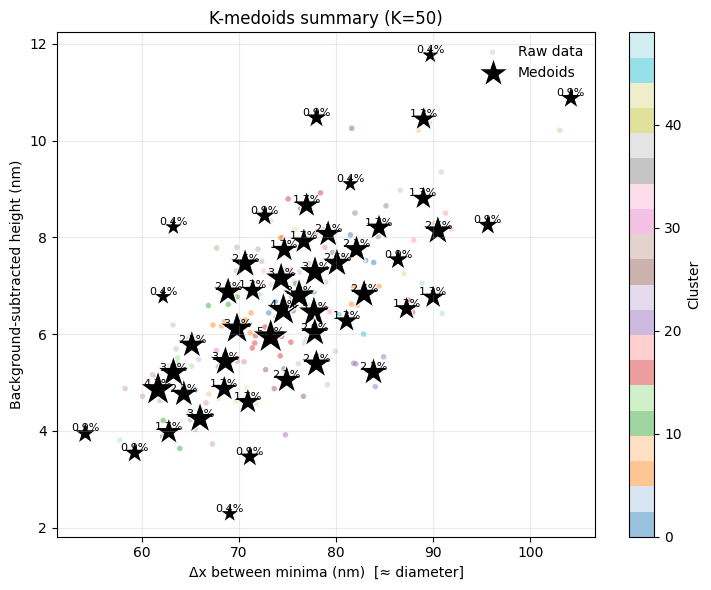

2248.587134 s


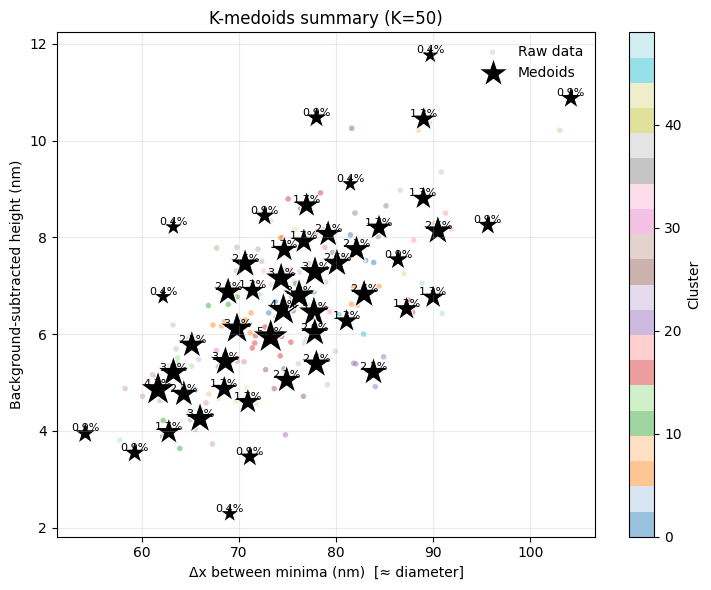

2257.878555 s


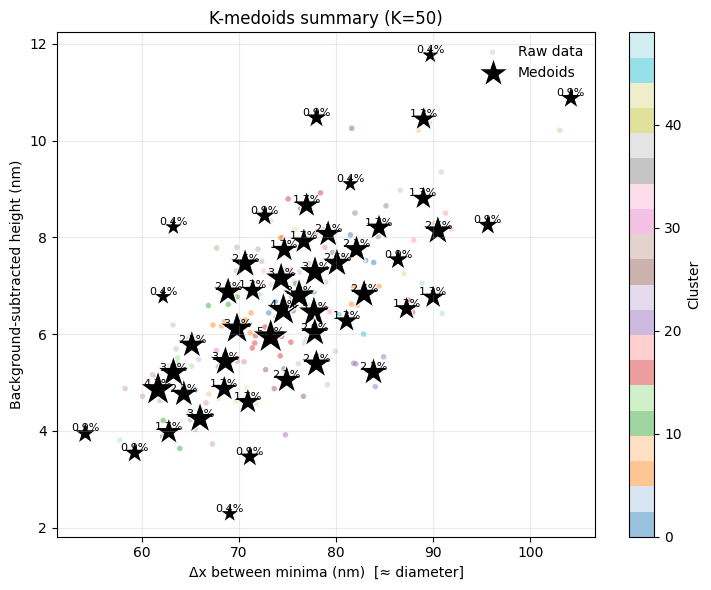

2255.801262 s


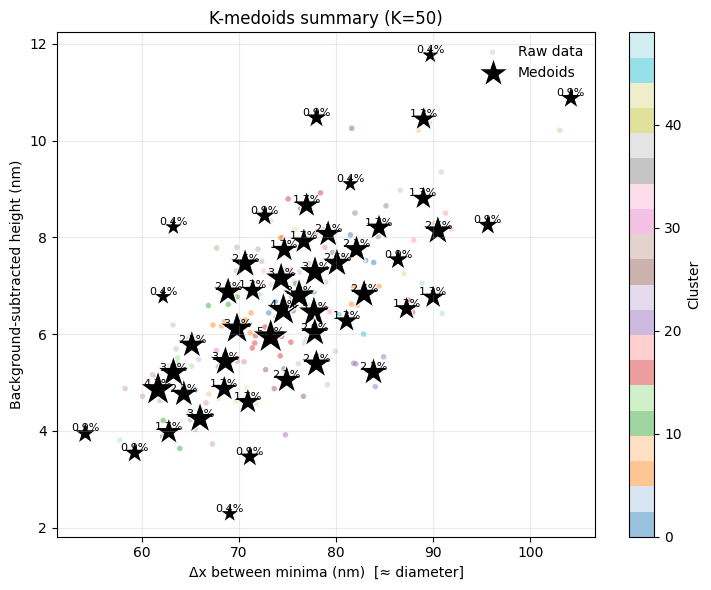

2240.719918 s


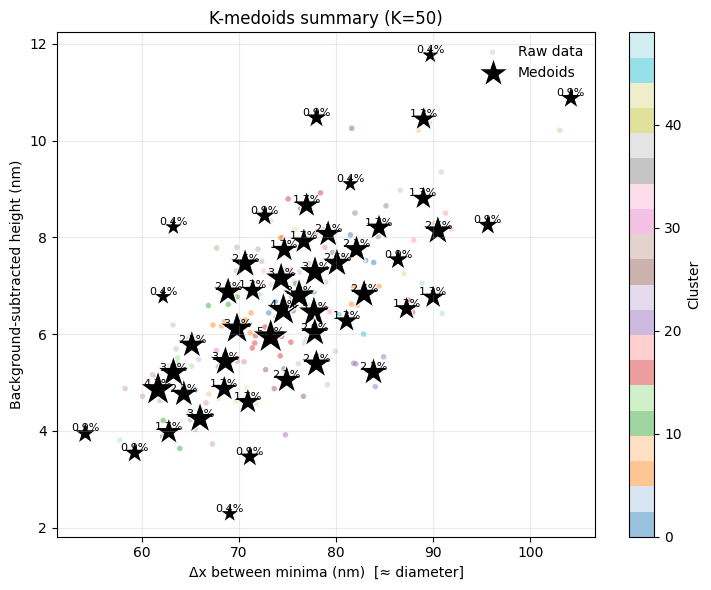

2277.323502 s


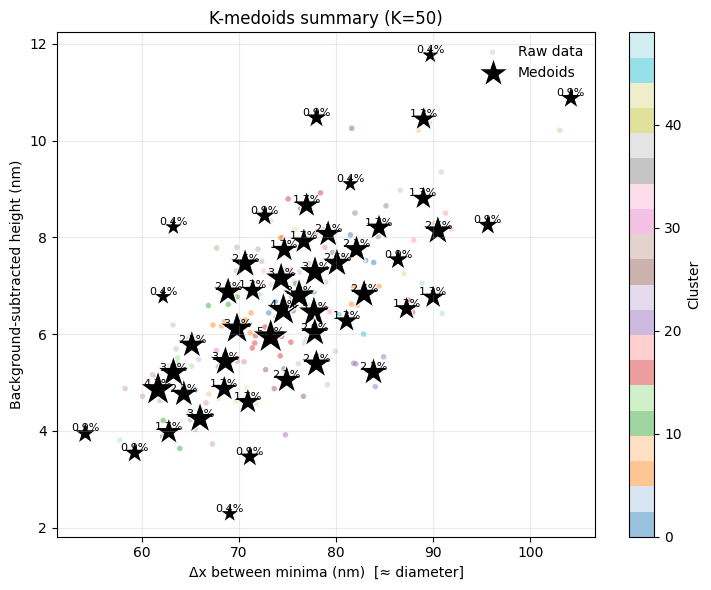

2247.671381 s


In [45]:
region = [150, 155, 250, 250]
number_of_samples = 50
kappa = [0, 1, 2, 3, 4, 10]
simData_array = []
for k in kappa:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_kappa(50, k), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_50_" + str(k) + '_kappa_0p15deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

In [ ]:
arr1=np.load("Sample35_JustSurface_AFM_k_50_10_kappa_0p1deg.txt.npy")

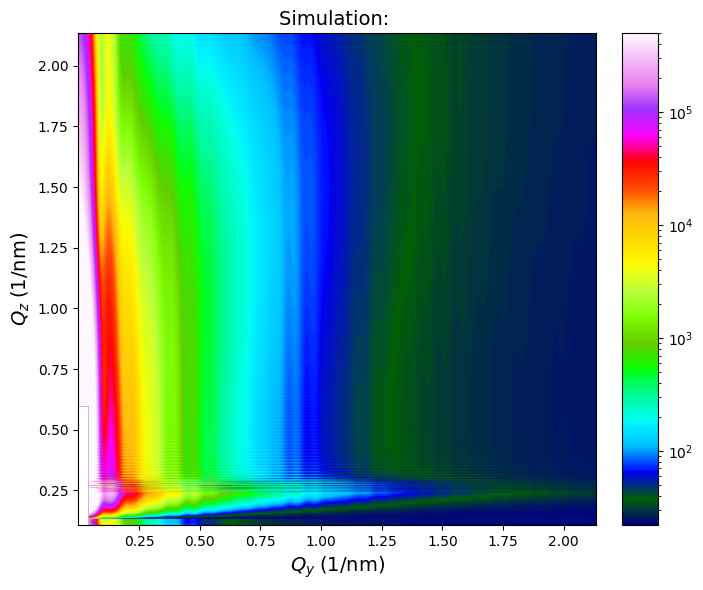

In [60]:
plot2D(realDat_axes=realDat_axes_Feb,simulationData=A)

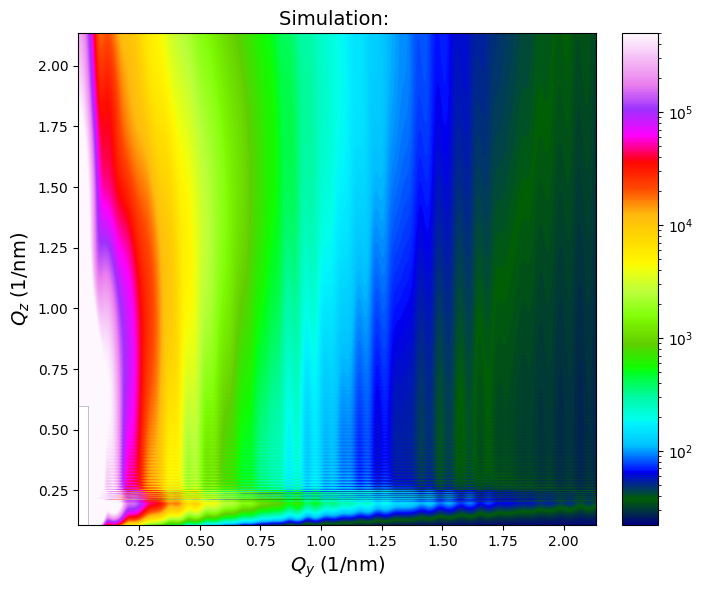

In [61]:
plot2D(realDat_axes=realDat_axes_Feb,simulationData=arr)

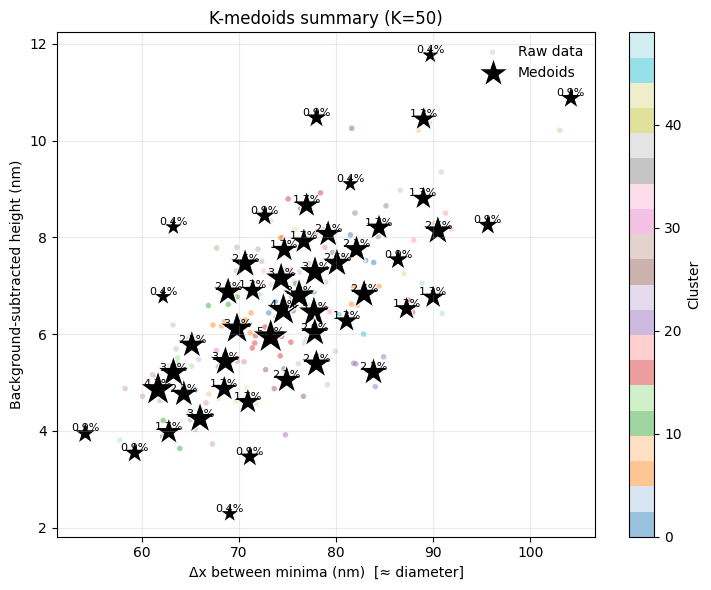

2271.724105 s


In [54]:
region = [150, 155, 250, 250]
number_of_samples = 50
kappa = [235]
simData_array = []
for k in kappa:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_kappa(50, k), detectorDistBeamtime= 'feb', angle = 0.1, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_50_" + str(k) + '_kappa_0p1deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

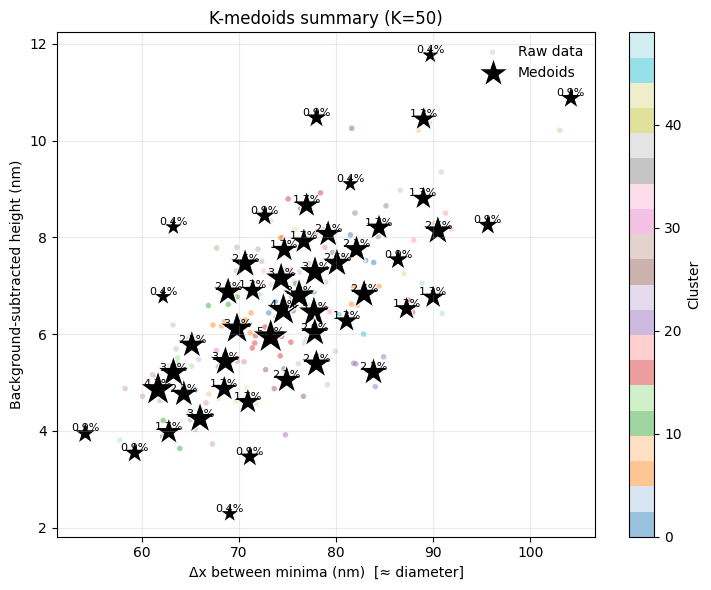

2278.485248 s


In [55]:
region = [150, 155, 250, 250]
number_of_samples = 50
kappa = [235]
simData_array = []
for k in kappa:
    t0 = perf_counter()
    simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_kappa(50, k), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
    result = simulation_2D.simulate()
    simul_dat = result.extracted_field()
    final_array = simul_dat.npArray()
    save_filename = "Sample35_JustSurface_AFM_k_50_" + str(k) + '_kappa_0p15deg.txt'
    np.save(save_filename, final_array)
    simData_array.append(final_array) 
    elapsed = perf_counter() - t0
    print(f"{elapsed:.6f} s")

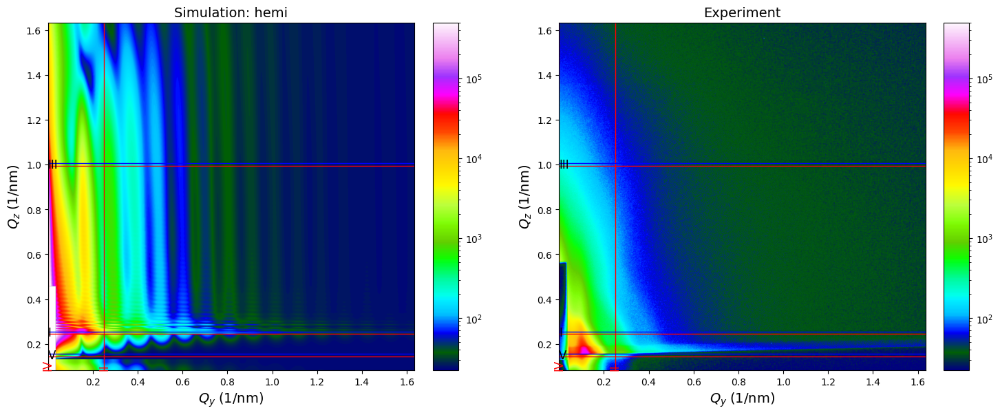

C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:83: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  ax.set_xlim(min(x_data_all), max(x_data_all))
C:\Users\Pedro\AppData\Local\Temp\ipykernel_3800\1315039889.py:85: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax.set_ylim(min(y_data_all), max(y_data_all) * 1.1)


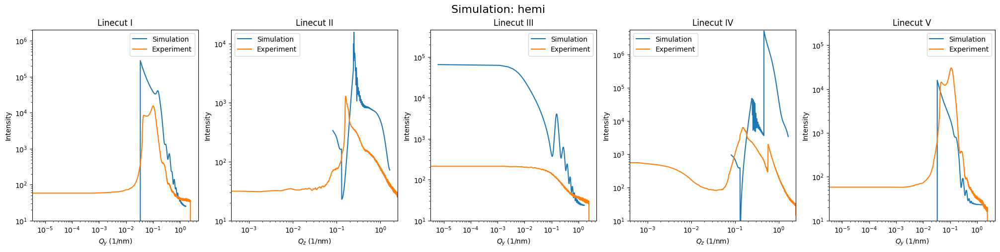

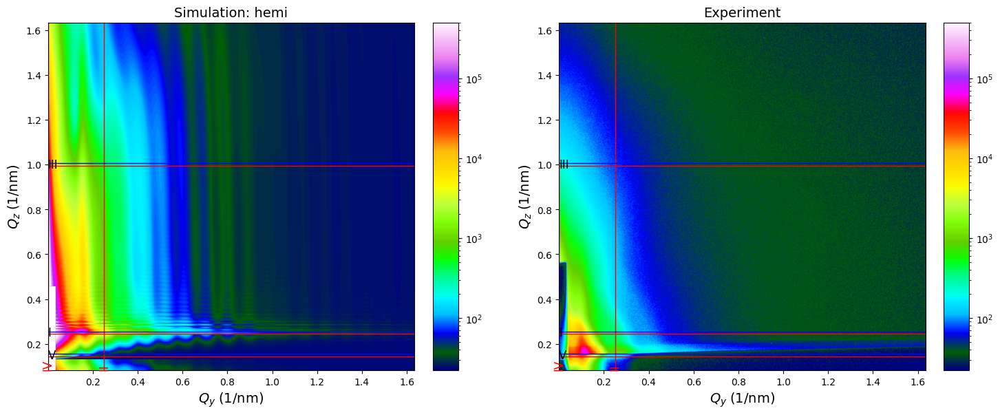

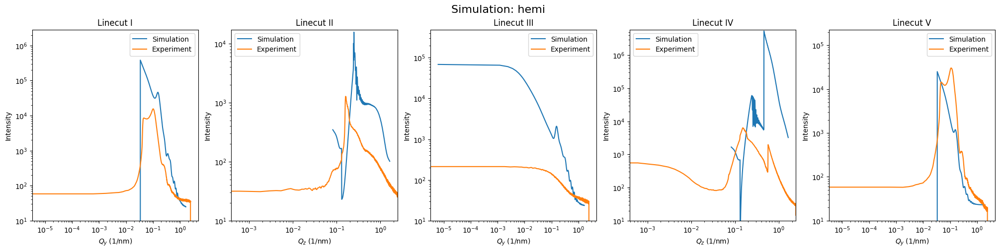

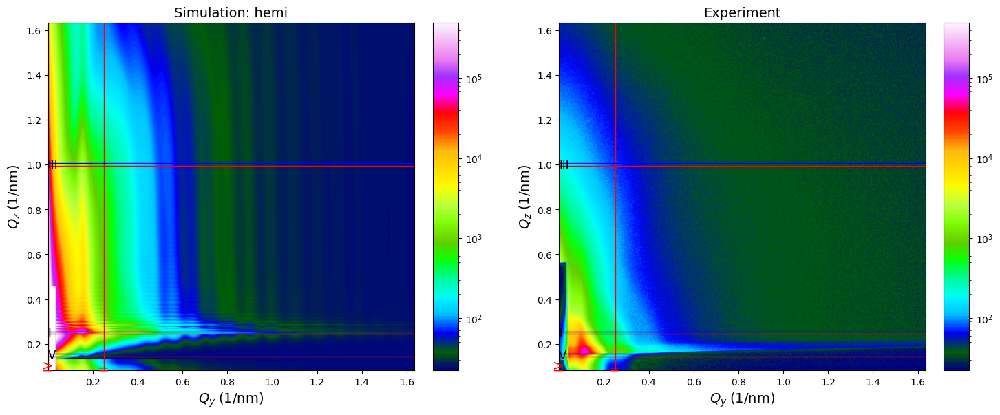

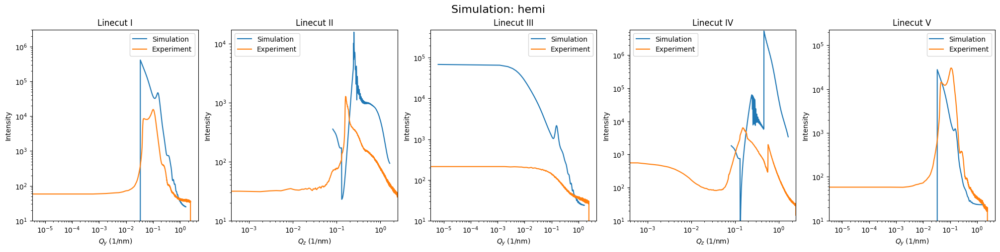

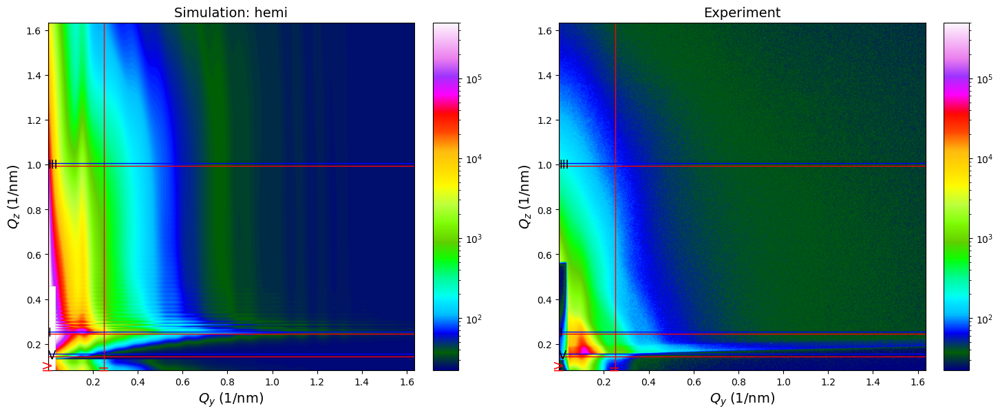

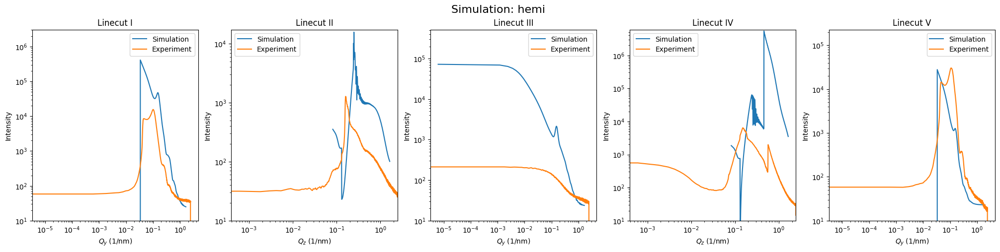

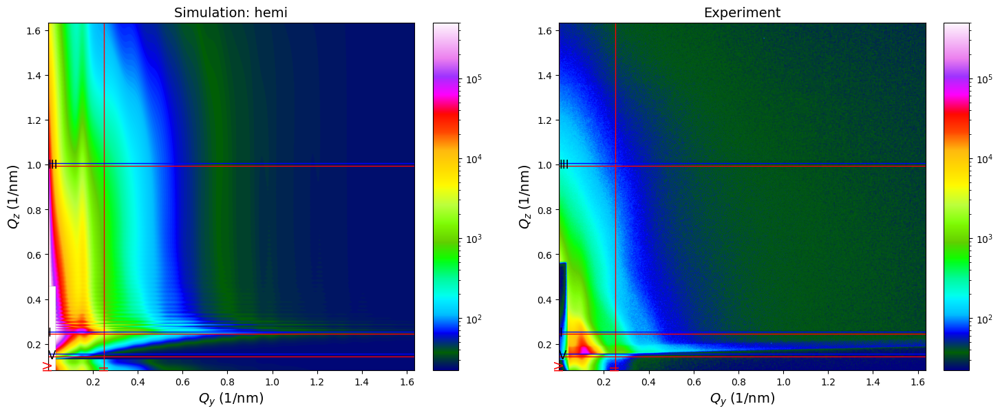

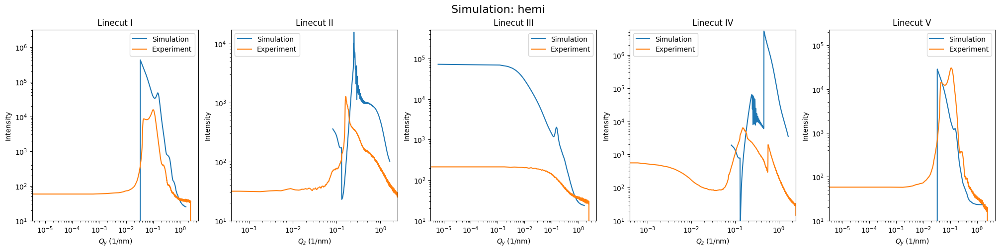

In [16]:
linecuts=[
    0.25,
    0.25,
    1,
    0,
    0.15
]
for i, data in enumerate(simData_array):
       plot2D(realData=realData_npArray, simulationData=data, L1_qz=linecuts[0], L2_qy=linecuts[1], 
              L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')
       linecutsItoV(simulation_data=data, experimental_data=realData_npArray, L1_qz=linecuts[0], L2_qy=linecuts[1], 
              L3_qz=linecuts[2], L4_qy=linecuts[3], L5_qz=linecuts[4], title='hemi')

For 15deg seems like the following parameters work well:
omega_order = 9*nm
    spacing = 50*nm

    diam_K, height_K, weight_K, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=P1, scale=True)
    visualize_kmedoids(dmin_nm/3.1, hsub_nm, diam_K/3.1, height_K, labels, weight_rep=weight_K)
    
    Factor = 3.1
    #########################################----SURFACE PARTICLES----################################################
    surface_layout = ba.ParticleLayout()
    for i in range(P1):
        ff_PS = ba.HemiEllipsoid((diam_K[i]/Factor) * nm, (diam_K[i]/Factor) * nm, height_K[i] * nm)
        particle_PS= ba.Particle(material_PS, ff_PS)
        surface_layout.addParticle(particle_PS, weight_K[i])
    
    # Interference Functions
    iff = ba.InterferenceRadialParacrystal(spacing, 250*nm)
    iff_pdf = ba.Profile1DGauss(omega_order)
    
    iff.setProbabilityDistribution(iff_pdf)
    
    iff.setKappa(1.5) #size-distribution model 

    surface_layout.setInterference(iff)
    surface_layout.setTotalParticleSurfaceDensity(0.0265)

In [27]:
def get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_tests(P1, P2):
    material_PS = ba.RefractiveMaterial("PS", 2.50267703E-06, 2.46904652E-09)
    material_Si_Sub = ba.RefractiveMaterial("Si Sub", 5.04383115E-06, 7.84182177E-08) #7.644e-06
    material_SiO2 = ba.RefractiveMaterial("SiO2", 4.74631315E-06, 4.16025294E-08)
    material_Vacuum = ba.RefractiveMaterial("Vacuum", 0.0, 0.0)

    omega_order = 9*nm
    spacing = 50*nm

    diam_K, height_K, weight_K, labels = summarize_pairs_kmedoids(dmin_nm, hsub_nm, K=P1, scale=True)
    visualize_kmedoids(dmin_nm/3.1, hsub_nm, diam_K/3.1, height_K, labels, weight_rep=weight_K)
    
    Factor = 3.1
    #########################################----SURFACE PARTICLES----################################################
    surface_layout = ba.ParticleLayout()
    for i in range(P1):
        ff_PS = ba.HemiEllipsoid((diam_K[i]/Factor) * nm, (diam_K[i]/Factor) * nm, height_K[i] * nm)
        particle_PS= ba.Particle(material_PS, ff_PS)
        surface_layout.addParticle(particle_PS, weight_K[i])
    
    # Interference Functions
    iff = ba.InterferenceRadialParacrystal(spacing, 250*nm)
    iff_pdf = ba.Profile1DGauss(omega_order)
    
    iff.setProbabilityDistribution(iff_pdf)
    
    iff.setKappa(1.5) #size-distribution model 

    surface_layout.setInterference(iff)
    surface_layout.setTotalParticleSurfaceDensity(0.0265)
    

    #----------------Roughness---------------------------------------------
    #----------------PS----------------------------------------------------
    hurst = 0.49
    corr = 84*nm
    sig = 3.2*nm
    roughness_PS = ba.LayerRoughness(sig, hurst, corr)
    #hurst = 0.7
    #corr = 200*nm
    #sig = 6.795*nm
    #roughness_PS = ba.LayerRoughness(sig, hurst, corr)

    #----------------SiO2---------------------------------------------------
    hurst = 0.52
    corr = 10*nm
    sig = 0.2*nm
    roughness_SiO2 = ba.LayerRoughness(sig, hurst, corr)

    # Define layers
    layer_vac = ba.Layer(material_Vacuum)
    layer_PS_Top = ba.Layer(material_PS, 214.8*nm)
    layer_vac.addLayout(surface_layout)
    layer_SiO2 = ba.Layer(material_SiO2, 2*nm)
    layer_Si = ba.Layer(material_Si_Sub)

     # Define sample 
    sample = ba.MultiLayer()
    sample.addLayer(layer_vac)
    sample.addLayerWithTopRoughness(layer_PS_Top, roughness_PS)
    sample.addLayerWithTopRoughness(layer_SiO2, roughness_SiO2)
    sample.addLayer(layer_Si)


    return sample

In [66]:
reload(g2)

<module 'GISAXS_V6_ROI' from 'c:\\Users\\Pedro\\Jupyter Notebooks\\Ripples Beginning\\New Sims\\GISAXS_V6_ROI.py'>

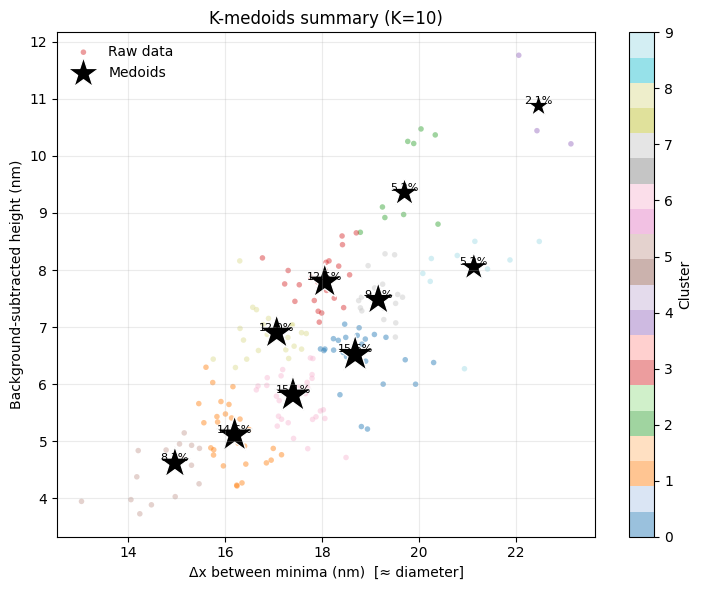

In [28]:
region = [150, 155, 212, 212]
number_of_samples = 10
kappa = 0
simData_array = []
simulation_2D = g2.get_simulation_2D(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_tests(number_of_samples, 0), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12,ROI=region)
#simulation_line = g2.get_simulation_line(sample_model=get_sample_thickFilmWithTopWithDistributionAndInterference_oldParams_varyingSampling_tests(number_of_samples, 0), detectorDistBeamtime='feb', angle_of_incidence= 0.14, center_horizontal_slice_value=0.22, center_vertical_slice_value= 0, number_slices=5)
#simulation_2D = g2.get_simulation_2D(sample_model=g2.get_sampleTest(), detectorDistBeamtime= 'feb', angle = 0.15, beamIntensity = 8e12, ROI= region)
result = simulation_2D.simulate()
simul_dat = result.extracted_field()
final_array = simul_dat.npArray()
save_filename = "tests_15deg_2D.npy"
np.save(save_filename, final_array)
simData_array.append(final_array) 

In [34]:
simulationDataAxes = g2.get_axes_limits(result, ba.Coords_QSPACE)
data2D = np.load("tests_15deg_2D.npy")

In [35]:
import Graphing_Analysis as graphing

In [36]:
reload(graphing)

<module 'Graphing_Analysis' from 'c:\\Users\\Pedro\\OneDrive - McMaster University\\PhD - School\\Research\\Projects\\X Ray Scattering and Diffraction\\GISAXS Analysis\\Final Simulations\\Simulation Log\\BornAgain24\\Graphing_Analysis.py'>

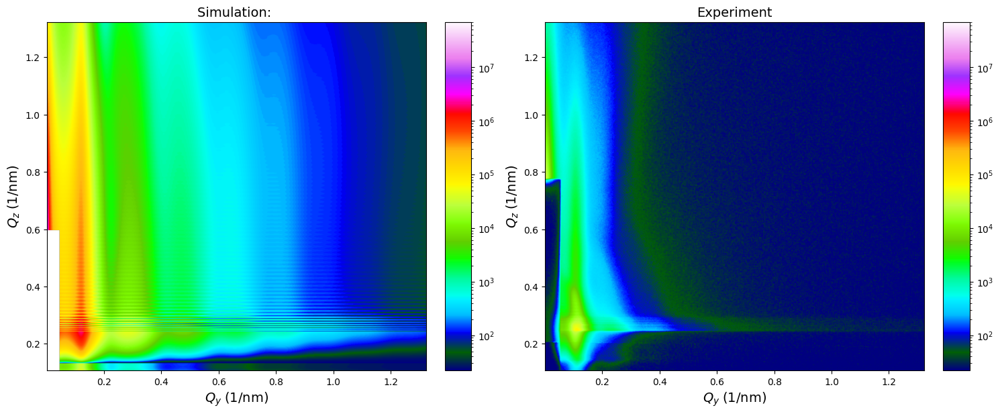

In [37]:
%matplotlib inline
graphing.plot2D(simulationData=data2D, simData_axes=simulationDataAxes, realData=realData_npArray, realDat_axes=realDat_axes_Feb, zlim=[22,70000000])

0.24123850776590502


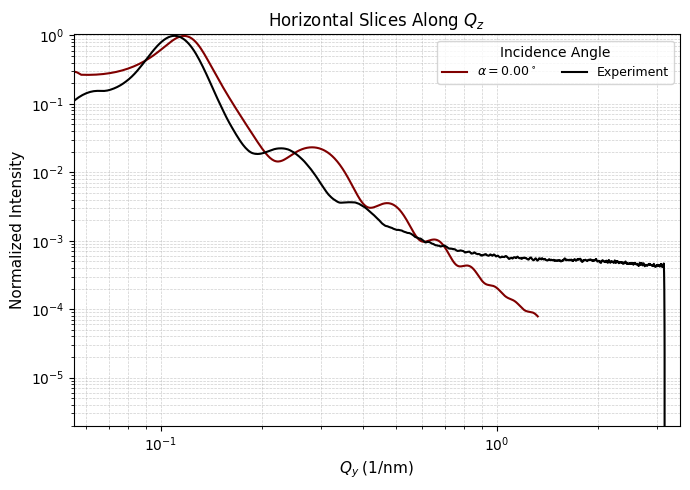

In [38]:
vert_slice_q = 0.2
graphing.yonedaPlot(vert_slice_q, [data2D], data_axes=simulationDataAxes, data2_npArray=realData_npArray, data_axes2=realDat_axes_Feb) #, data2_npArray=realData_npArray, data_axes2=realDat_axes_Feb)